## Setup

In [27]:
import anndata
import numpy as np
import pandas as p
import seaborn as sns
from scipy import stats
import liana as li
import scanpy as sc
import cell2cell as c2c
import decoupler as dc # needed for pathway analysis
from collections import defaultdict
import pickle
import torch
import io
import plotnine as p9
import decoupler as dc # needed for pathway analysis
#from statannotations.Annotator import Annotator
from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean
import os
import omnipath as op
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from io import BytesIO
import PIL.Image
from typing import Callable
from pathlib import Path


In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 80, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
annotated_types     0.6.0
asttokens           NA
attr                23.2.0
brotli              1.1.0
cell2cell           0.7.3
certifi             2024.02.02
charset_normalizer  3.3.2
comm                0.2.1
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
decoupler           1.6.0
docrep              0.3.2
exceptiongroup      1.2.0
executing           2.0.1
h5py                3.10.0
idna                3.6
inflect             NA
ipykernel           6.29.2
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
kneed               0.8.5
liana               1.0.4
llvmlite            0.42.0
matplotlib          3.8.4
mizani              0.11.0
mpl_toolkits        NA
mudata              0.2.3
natsort             8.4.0
networkx            3.2.1
numba               0.59.0
numpy               1.26.4
omnipath

In [4]:
def save_plot_to_buffer(plot_func, *args, **kwargs):
    buf = BytesIO()
    plot_func(*args, **kwargs)
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close()
    return buf

def unpickle_gpu_tensor(filepath: str, processing_unit: str):
    '''
    Function to load a pickled tensor file created using cell2cell with gpu acceleration

    filepath: str = path of the tensor file
    processing_unit: str = processing_unit used in the current environment to load the file onto (either "gpu" or "cpu")
    '''
    class CPU_Unpickler(pickle.Unpickler):
        def find_class(self, module, name):
            if module == 'torch.storage' and name == '_load_from_bytes':
                return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
            else: return super().find_class(module, name)

    processing_unit_values = ['cpu', 'gpu']
    if processing_unit == 'cpu':
        with open(filepath, 'rb') as f:
            tensor = CPU_Unpickler(f).load()
    elif processing_unit == 'gpu':
        with open(filepath, 'rb') as f:
            tensor = pickle.load(f)
    else:
        raise ValueError(f'accelerator must be one of {processing_unit_values}')
    return tensor


def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    if norm_vec1 == 0 or norm_vec2 == 0:
        return 0.0  
    return dot_product / (norm_vec1 * norm_vec2)

def find_outlier_vectors(
        df: pd.DataFrame,
        col_vec: bool=True,
        normalize_df: bool=True,
        aggregate_func: Callable=np.mean,
        **aggregate_func_argument
):
    if col_vec:
        df = df.T
    if normalize_df:
        df = df.div(df.sum(axis=1), axis=0)
    similarity_matrix = pairwise.cosine_similarity(df)
    np.fill_diagonal(similarity_matrix, 0)
    aggregated_similarity = aggregate_func(similarity_matrix, **aggregate_func_argument)
    indices = df.index[np.argsort(aggregated_similarity)]
    values = np.sort(aggregated_similarity)
    return pd.DataFrame(data=values, index=indices)

def get_tensor_factors(
    tensor: c2c.tensor.PreBuiltTensor
) -> list:
    return list(tensor.factors['Contexts'].columns)

def check_factor_completion(
        factor_df: pd.DataFrame,
        cell_types: set
):
    difference = cell_types.difference(factor_df.index)
    if difference:
        for cell_type in difference:
            factor_df.loc[cell_type] = np.zeros(factor_df.shape[1], dtype=np.float32)
    factor_df = factor_df.sort_index()
    return factor_df

def get_tensor_signalling_arrays(
        tensor: c2c.tensor.PreBuiltTensor,
        cell_types: set,
) -> dict:
    tensor_factors = get_tensor_factors(tensor)
    tensor_signalling_arrays = {}
    for factor in tensor_factors:
        sender_df = check_factor_completion(
            tensor.factors['Sender Cells'],
            cell_types
        )
        receiver_df = check_factor_completion(
            tensor.factors['Receiver Cells'],
            cell_types
        )
        sender_cell_array = sender_df[factor].to_numpy()
        receiver_cell_array = receiver_df[factor].to_numpy()
        tensor_signalling_arrays[factor] = np.concatenate(
            (
                sender_cell_array,
                receiver_cell_array
            )
        )
    return tensor_signalling_arrays

def find_mutual_best_fits(
        tensor_1_signalling_arrays: dict,
        tensor_2_signalling_arrays: dict
) -> dict:
    best_fits_1_to_2 = {}
    for factor1, array1 in tensor_1_signalling_arrays.items():
        best_match = None
        highest_similarity = -1
        for factor2, array2 in tensor_2_signalling_arrays.items():
            similarity = cosine_similarity(array1, array2)
            if similarity > highest_similarity:
                highest_similarity = similarity
                best_match = factor2
        best_fits_1_to_2[factor1] = best_match

    best_fits_2_to_1 = {}
    for factor2, array2 in tensor_2_signalling_arrays.items():
        best_match = None
        highest_similarity = -1
        for factor1, array1 in tensor_1_signalling_arrays.items():
            similarity = cosine_similarity(array2, array1)
            if similarity > highest_similarity:
                highest_similarity = similarity
                best_match = factor1
        best_fits_2_to_1[factor2] = best_match

    mutual_best_fits = {}
    for factor1, best_fit_factor2 in best_fits_1_to_2.items():
        if best_fits_2_to_1.get(best_fit_factor2) == factor1:
            mutual_best_fits[factor1] = best_fit_factor2

    return mutual_best_fits

def return_sender_receiver_factor_df(
        tensor: c2c.tensor.PreBuiltTensor,
        cell_types: set,
        factor_condition: str = None
) -> pd.DataFrame:
    sender_df: pd.DataFrame = check_factor_completion(tensor.factors['Sender Cells'], cell_types)
    sender_df.index = ['sender_' + index for index in sender_df.index]
    receiver_df: pd.DataFrame = check_factor_completion(tensor.factors['Sender Cells'], cell_types)
    receiver_df.index = ['receiver_' + index for index in receiver_df.index]
    sender_receiver_df = pd.concat(
        [
            sender_df,
            receiver_df
        ]
    )
    sender_receiver_df.columns = [f'{factor_condition}_' + column for column in sender_receiver_df.columns]
    return sender_receiver_df

In [33]:
data_dir = Path.cwd() / '.data'
figures_dir = data_dir / 'figures'
data_dir.mkdir(exist_ok=True)
figures_dir.mkdir(exist_ok=True)

In [31]:
adata_file = data_dir / 'Marburg_cell_states_locked_ctl240709.raw.h5ad' 
adata_all = sc.read_h5ad(adata_file)
adata_all

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    uns: 'cell_compartment_colors', 'cell_states_colors', 'disease_colors', 'group_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_umap'

In [8]:
sample_key = 'batch'
condition_key = 'infection'
groupby = 'cell_compartment'

context_dict = adata_all.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)
# Generate color by severity for each sample
condition_colors = c2c.plotting.aesthetics.get_colors_from_labels(['CTRL', 'IAV'], cmap='plasma')
# Map these colors to each sample name
color_dict = {k : condition_colors[v] for k, v in context_dict.items()}
col_colors = pd.Series(color_dict)
col_colors = col_colors.to_frame()
col_colors.columns = ['infection status']
context_dict

defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'CTRL',
             'CSE_06_CRTL': 'CTRL',
             'GER14_CRTL': 'CTRL',
             'GnR08_CTRL': 'CTRL',
             'GER12_CTRL': 'CTRL',
             'GER02_CTRL': 'CTRL',
             'ST10_GnR_IAV': 'IAV',
             'GnR_07_IAV': 'IAV',
             'CHE01_IAV': 'IAV',
             'CHE02_IAV': 'IAV',
             'CHE03_IAV': 'IAV',
             'CSE03_IAV': 'IAV',
             'ST09_CSE_IAV': 'IAV',
             'GnR_07_CTRL': 'CTRL',
             'CHE01_CTRL': 'CTRL',
             'CHE02_CTRL': 'CTRL',
             'CHE03_CTRL': 'CTRL',
             'CSE03_CTRL': 'CTRL',
             'ST08_GnR_CTRL': 'CTRL',
             'CSE_06_IAV': 'IAV',
             'GER14_IAV': 'IAV',
             'GnR08_IAV': 'IAV',
             'GER12_IAV': 'IAV',
             'GER02_IAV': 'IAV'})

In [ ]:
palette={
    'Basal': '#a6cee3',
    'Goblet': '#1f78b4',
    'SupraB': '#b2df8a',
    'Ciliated': '#33a02c',
    'Mixed': '#fb9a99',
    'Secretory': '#e31a1c',
    'Club': '#fdbf6f',
    'Deuterosomal': '#ff7f00',
    'Ionocyte': '#cab2d6',
    'Epi': '#6a3d9a',
}

## Analysis

### Healthy

### Loading Tensor Data

In [24]:
'''
Loading the output tensor of liana c2c tensor of healthy and copd subgroups
'''
# Healthy Tensor
file_name = 'final_tensor_compartment_healthy.pkl'
file_path = os.path.join(data_dir, file_name)
tensor_healthy = unpickle_gpu_tensor(file_path, 'cpu')
factors_healthy = tensor_healthy.factors

# COPD Tensor
file_name = 'final_tensor_compartment_COPD.pkl'
file_path = os.path.join(data_dir, file_name)
tensor_COPD = unpickle_gpu_tensor(file_path, 'cpu')
factors_COPD = tensor_COPD.factors

# Storing tensors in dict
tensor_dict = {
    'Healthy': tensor_healthy,
    'COPD': tensor_COPD,
}

### Determining mutual best fit factors from both conditions

In [57]:
cell_types = set(adata_all.obs['cell_compartment'])
signalling_array_dict = {condition: get_tensor_signalling_arrays(
    tensor=tensor,
    cell_types=cell_types
) for condition, tensor in tensor_dict.items()}
mutual_best_fits = find_mutual_best_fits(
    signalling_array_dict['Healthy'],
    signalling_array_dict['COPD'],
)
mutual_best_fits

{'Factor 1': 'Factor 1',
 'Factor 2': 'Factor 7',
 'Factor 3': 'Factor 2',
 'Factor 4': 'Factor 5',
 'Factor 6': 'Factor 4',
 'Factor 7': 'Factor 8'}

### Tensor Loading Clustermap

Healthy


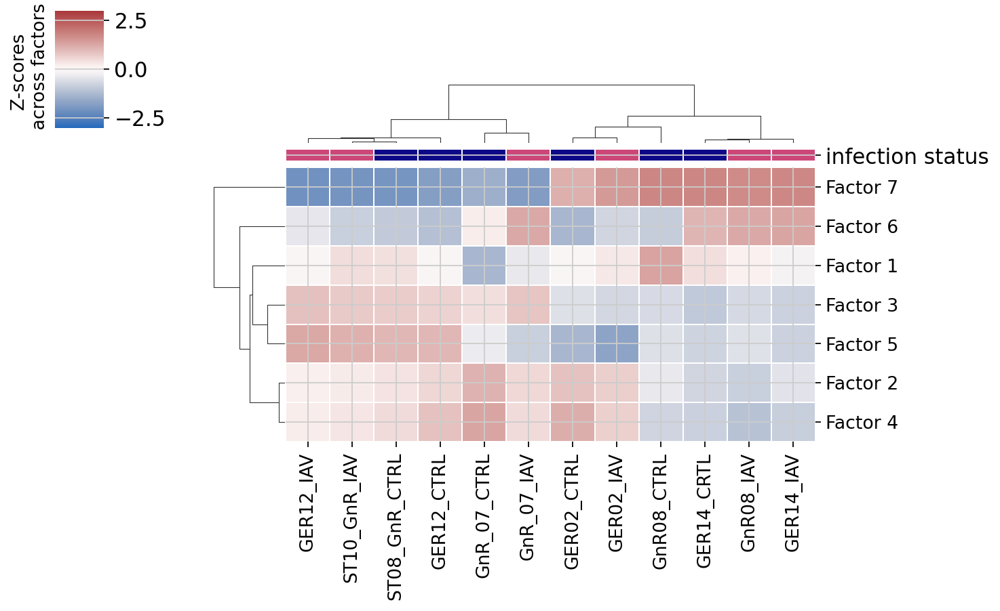

COPD


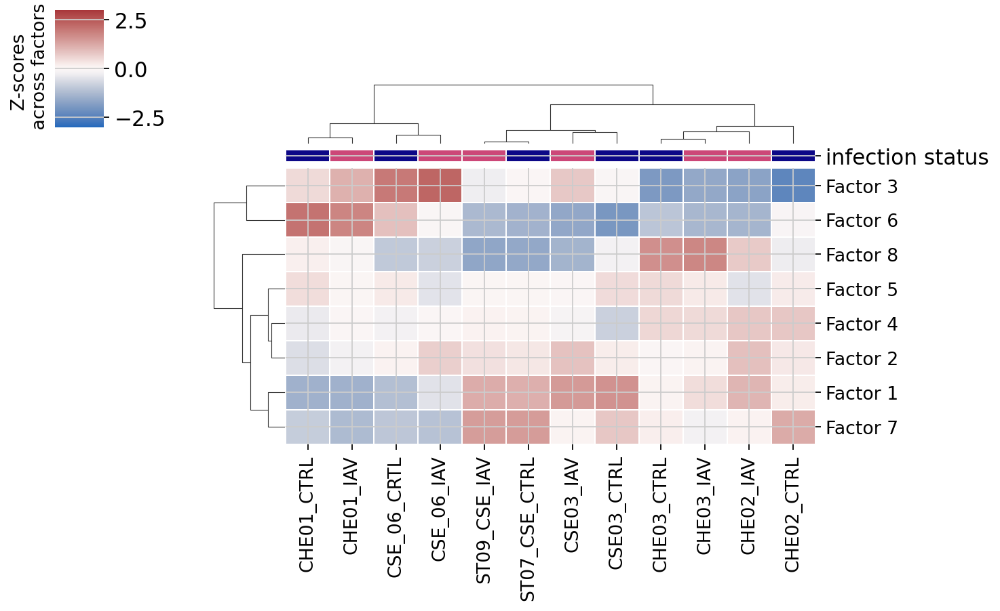

In [34]:
for condition, tensor in tensor_dict.items():
    c2c.plotting.loading_clustermap(
        tensor.factors['Contexts'],
        use_zscore=True,
        col_colors=col_colors,
        figsize=(9, 6),
        dendrogram_ratio=0.3,
        cbar_fontsize=12,
        tick_fontsize=12
    )
    output_dir = figures_dir / 'clustermap'
    output_dir.mkdir(exist_ok=True)
    plt.savefig(output_dir / f'clustermap_{condition}.svg')
    print(condition)
    plt.show()

### Compartments Barplot

{'Factor 1': 'Factor 1', 'Factor 2': 'Factor 7', 'Factor 3': 'Factor 2', 'Factor 4': 'Factor 5', 'Factor 6': 'Factor 4', 'Factor 7': 'Factor 8'}
Healthy


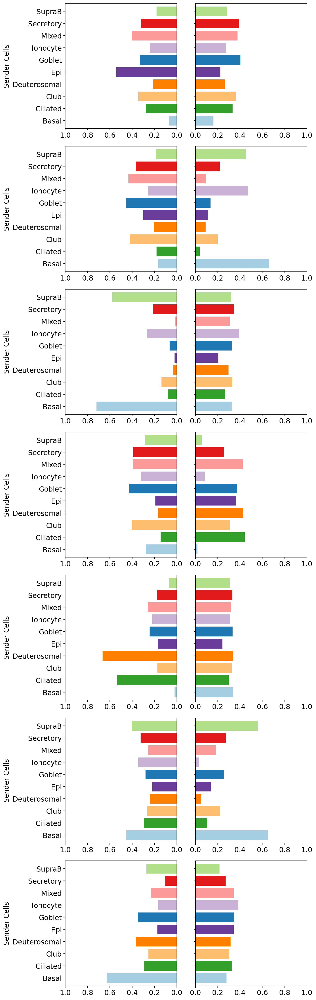

COPD


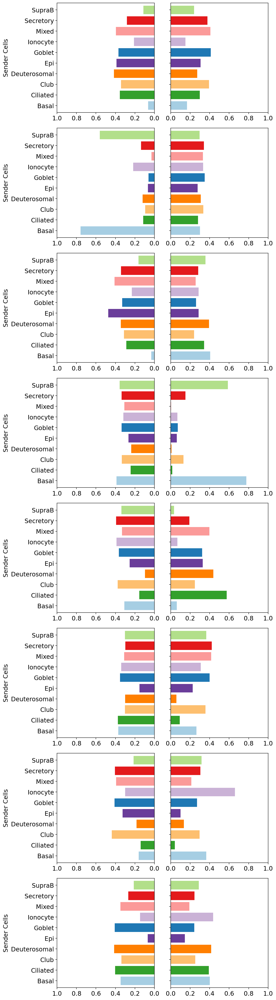

In [58]:
print(mutual_best_fits)
for condition, tensor in tensor_dict.items():
    factors = list(tensor.factors['Contexts'].columns)
    n_factors = len(factors)
    fig, axes = plt.subplots(n_factors, 2, figsize=(9, 4 * n_factors), sharey=True)
    colors = [palette[sender] for sender in tensor.factors['Receiver Cells'].index]
    width = 0.8
    for i, factor in enumerate(factors):
        tensor.factors['Sender Cells'][factor].plot(kind='barh', color=colors, ax=axes[i, 0], width=width)
        axes[i, 0].invert_xaxis()
        axes[i, 0].grid(False)
        tensor.factors['Receiver Cells'][factor].plot(kind='barh', color=colors, ax=axes[i, 1], width=width)
        axes[i, 0].set_xlim(1, 0)
        axes[i, 1].set_xlim(0, 1)
        axes[i, 1].grid(False)
    output_dir = figures_dir / 'compartments_barplots'
    output_dir.mkdir(exist_ok=True)
    plt.tight_layout()
    plt.savefig(output_dir / f'compartment_barplot_{condition}.svg')
    print(condition)
    plt.show()

### Context Boxplots

Healthy


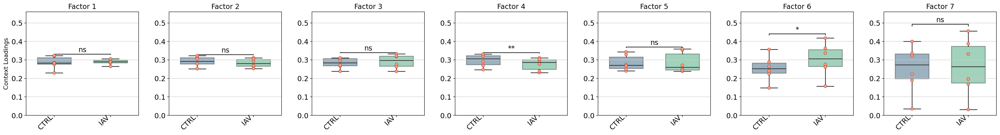

COPD


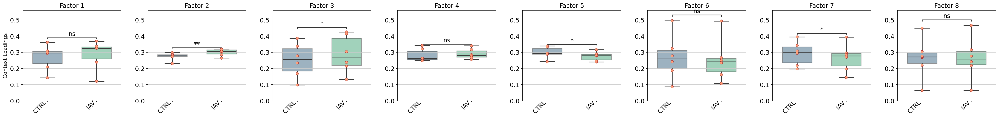

In [52]:
for condition, tensor in tensor_dict.items():
    n_factors = len(list(tensor.factors['Contexts'].columns))
    fig = c2c.plotting.factor_plot.context_boxplot(
        tensor.factors['Contexts'],
        metadict=context_dict,
        group_label_rotation=45,
        nrows=1,
        figsize=(n_factors * 4, 4),
        group_order=['CTRL', 'IAV'],
        statistical_test='t-test_paired',
        pval_correction='BH',
        verbose=False,
        cmap='viridis',
        ylabel="Context Loadings",
        text_format='star'
    )
    for ax in fig[0].axes:
        ax.set_ylim(0, 0.56)  # Set y-axis limits from 0 to 0.5
    output_dir = figures_dir / 'context_boxplots'
    output_dir.mkdir(exist_ok=True)
    plt.tight_layout()
    plt.savefig(output_dir / f'context_boxplots_{condition}.svg')
    print(condition)
    plt.show()

### CCC Networks Plot

Healthy


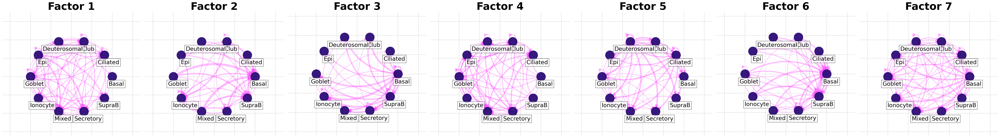

COPD


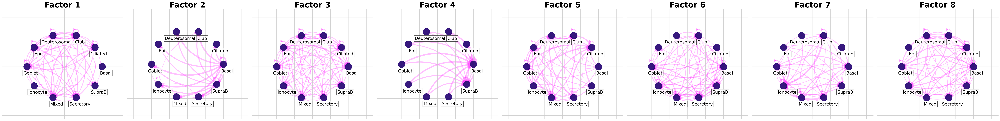

In [53]:

for condition, tensor in tensor_dict.items():
    n_factors = len(list(tensor.factors['Contexts'].columns))
    c2c.plotting.ccc_networks_plot(
        tensor.factors,
        included_factors=[factor for factor in list(tensor.factors['Contexts'].columns)],
        network_layout='circular',
        ccc_threshold=0.07,
        nrows=1,
        panel_size=(n_factors, n_factors),
    )
    output_dir = figures_dir / 'ccc_networks_plot'
    output_dir.mkdir(exist_ok=True)
    plt.tight_layout()
    plt.savefig(output_dir / f'ccc_networks_plot_{condition}.svg')
    print(condition)
    plt.show()

### LR Loadings Plots

In [9]:
'''
Loading PROGENy pathways and list of ligand receptor pairs
'''
net = dc.get_progeny(organism='human', top=5000)
lr_pairs = li.resource.select_resource('consensus')

/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:105: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:112: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the 

Healthy Factor 1


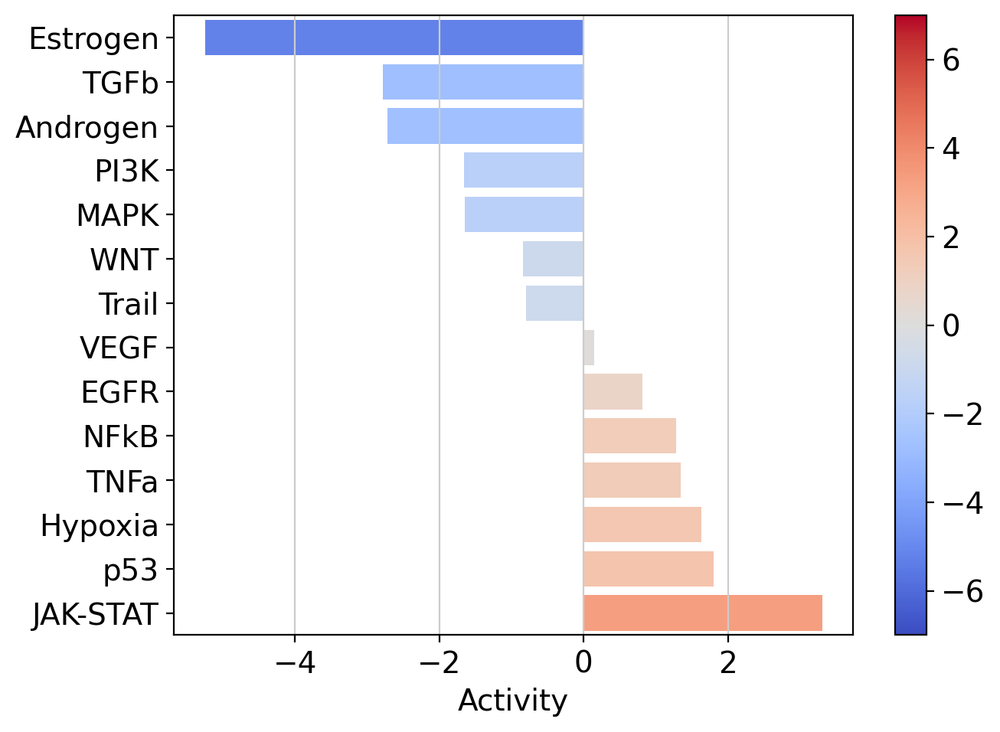

Healthy Factor 2


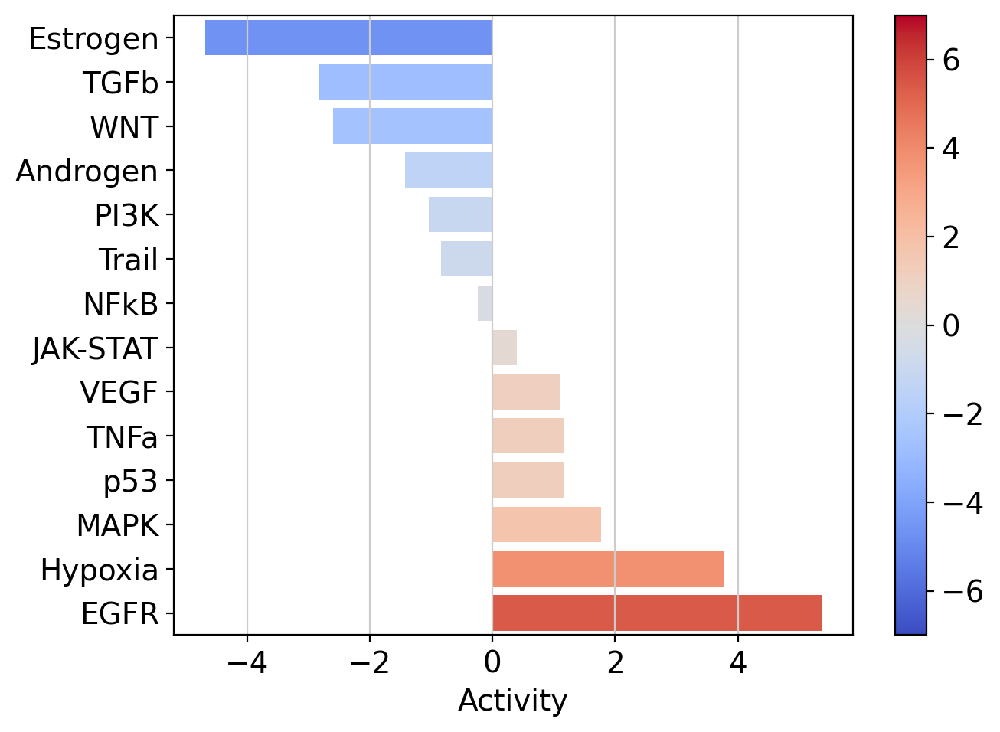

Healthy Factor 3


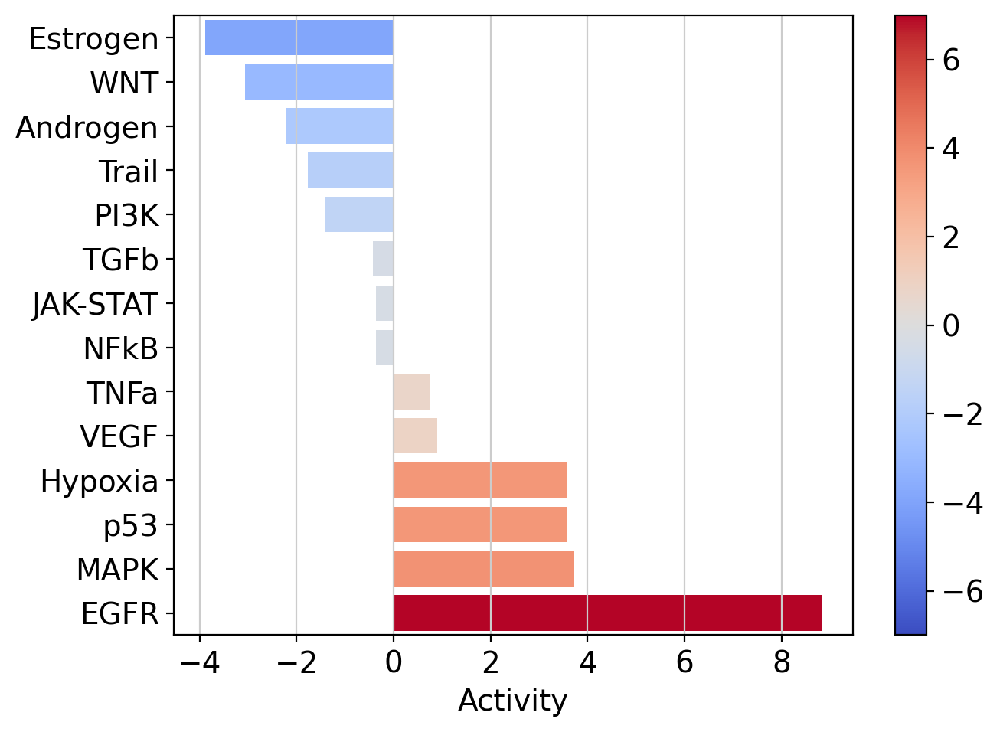

Healthy Factor 4


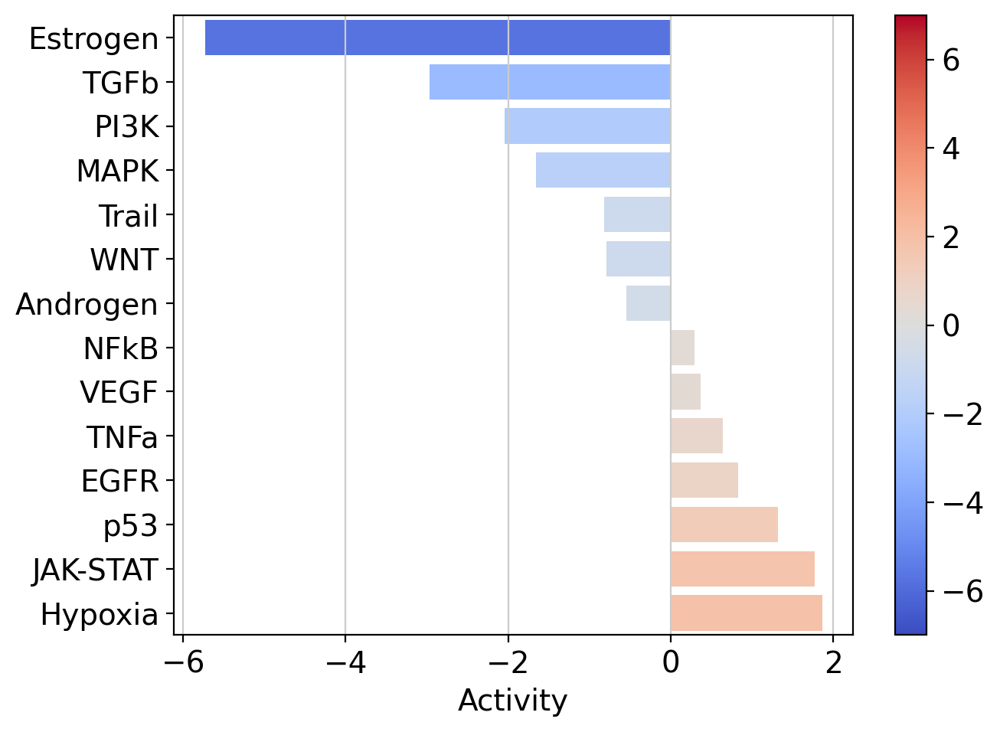

Healthy Factor 5


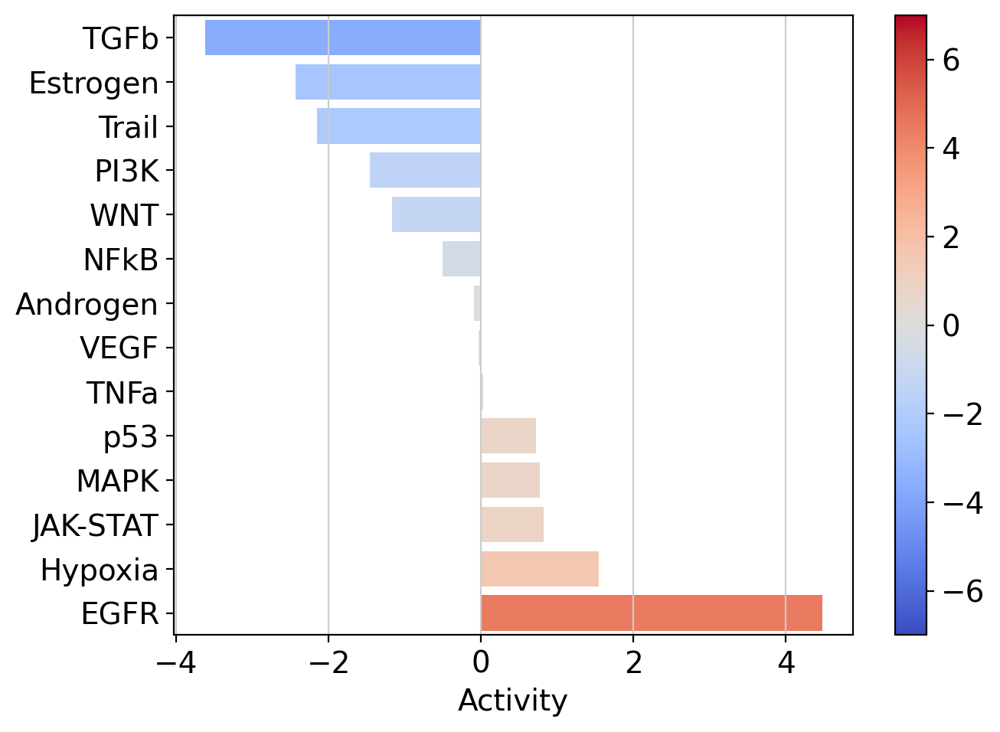

Healthy Factor 6


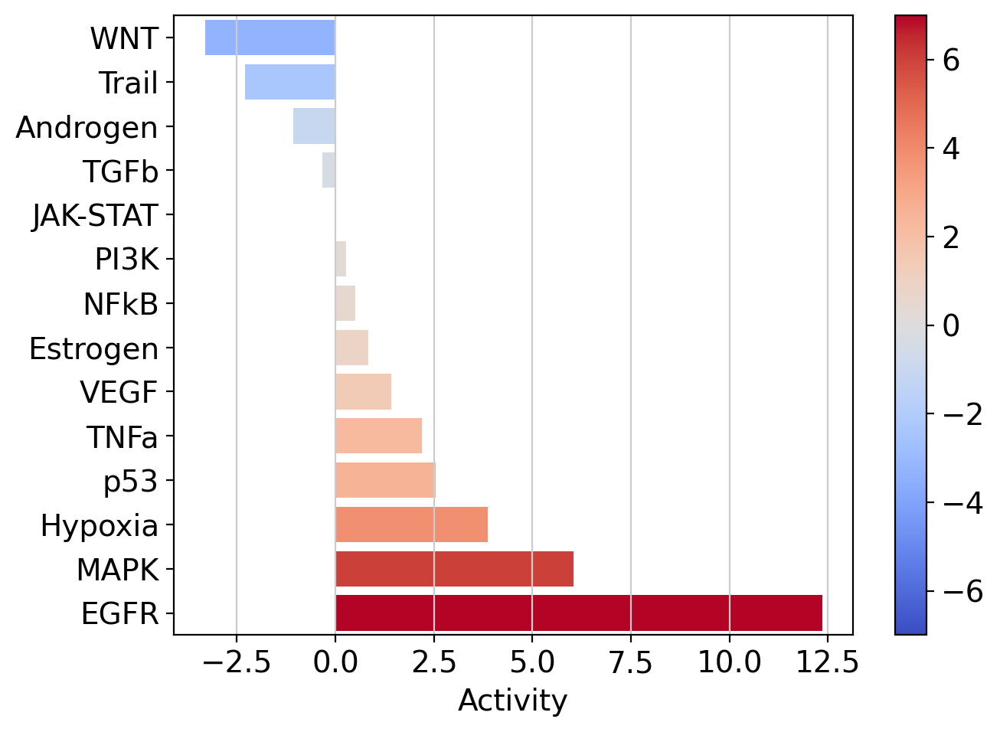

Healthy Factor 7


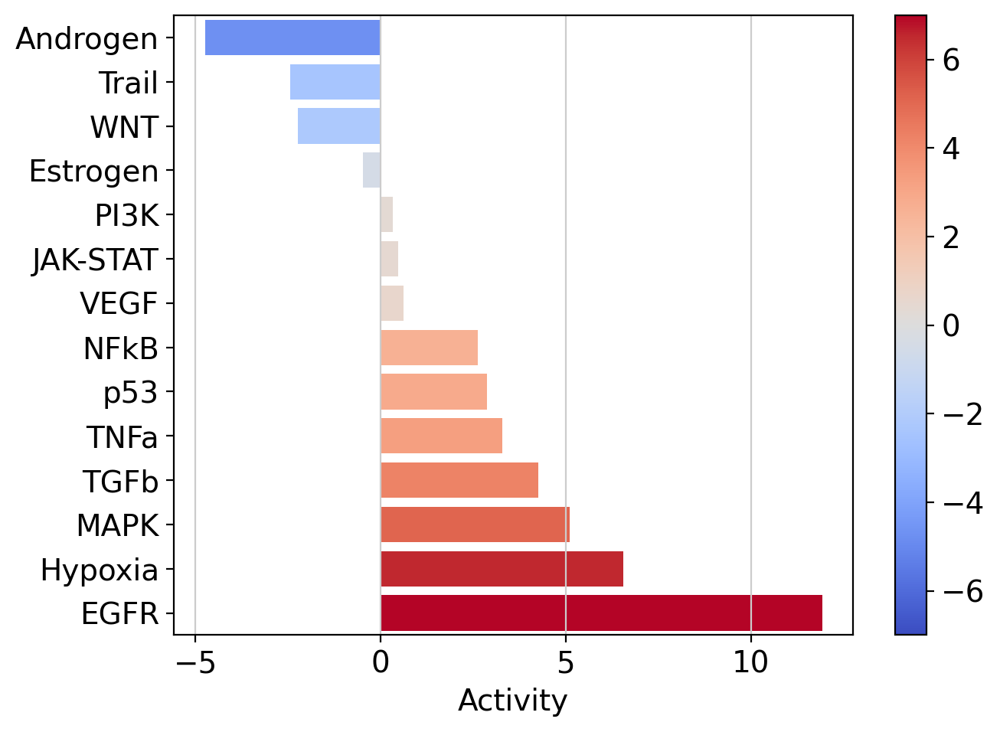

COPD Factor 1


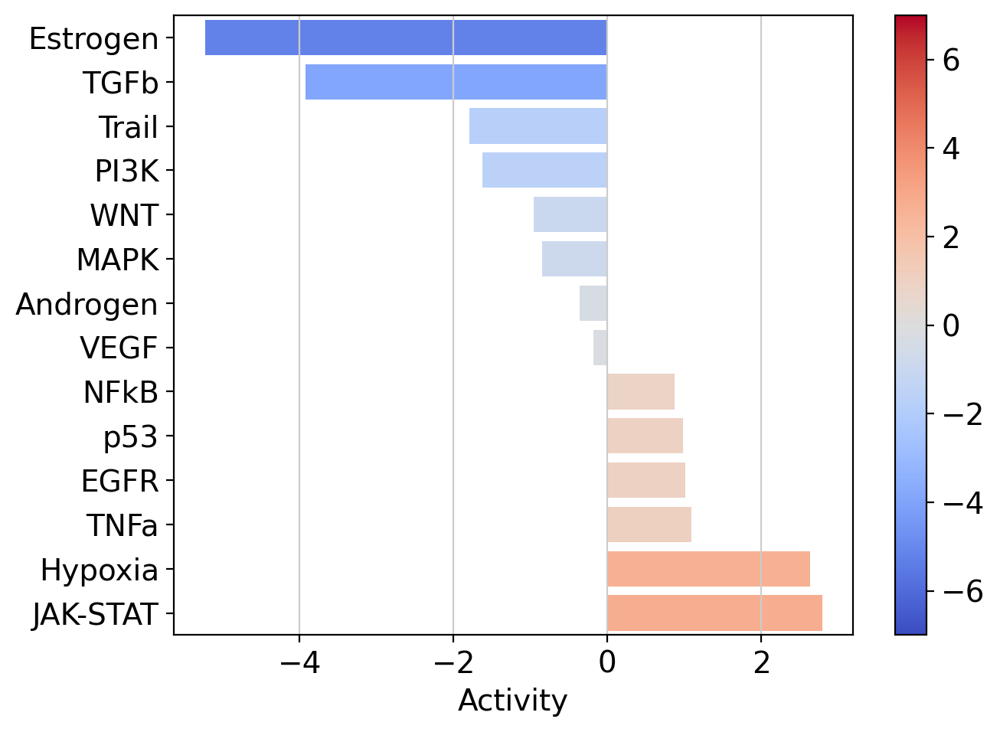

COPD Factor 2


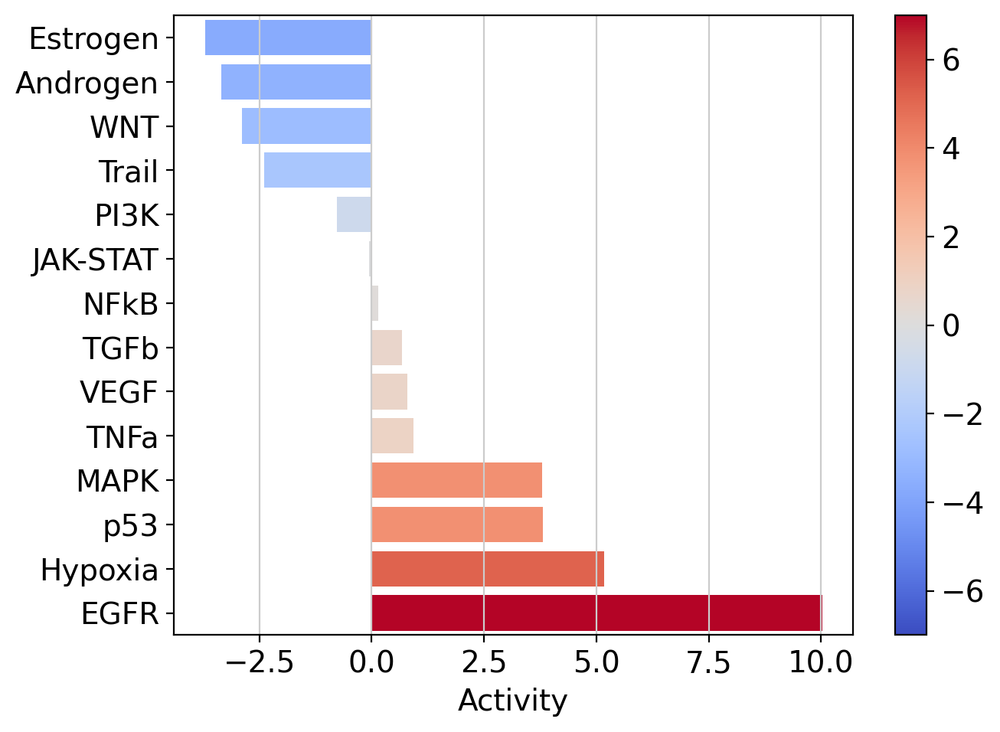

COPD Factor 3


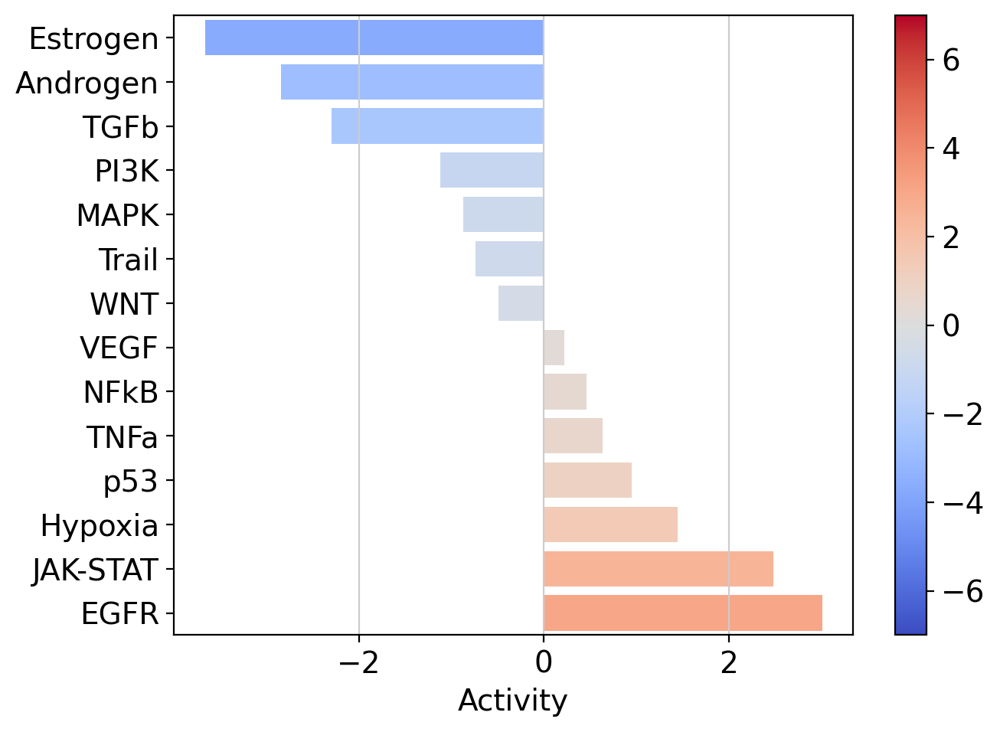

COPD Factor 4


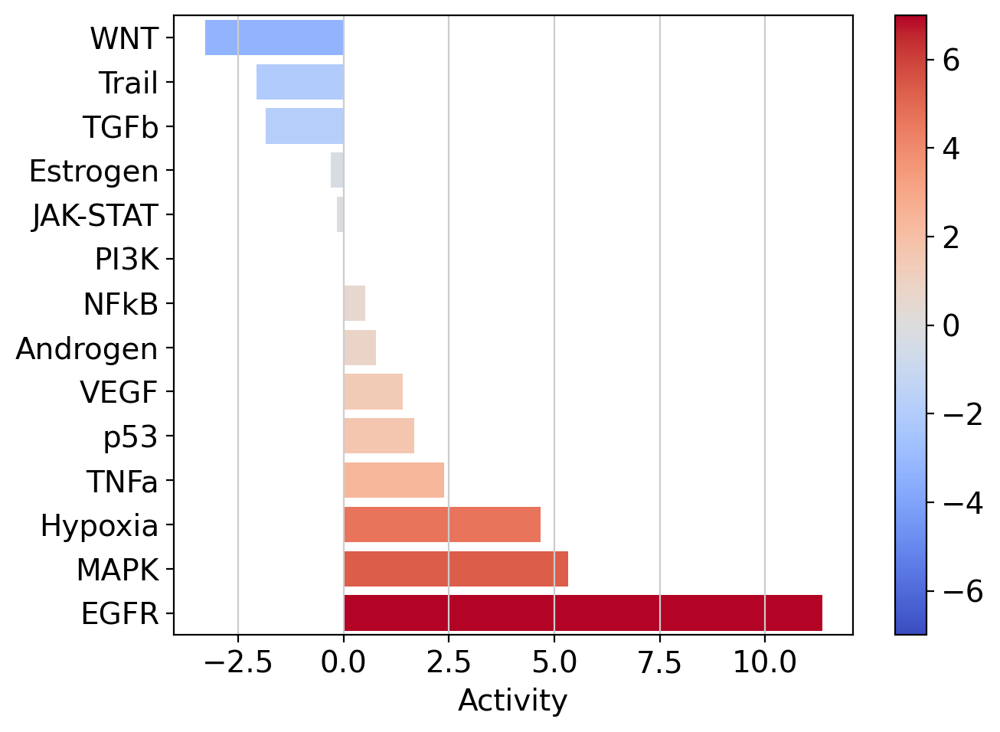

COPD Factor 5


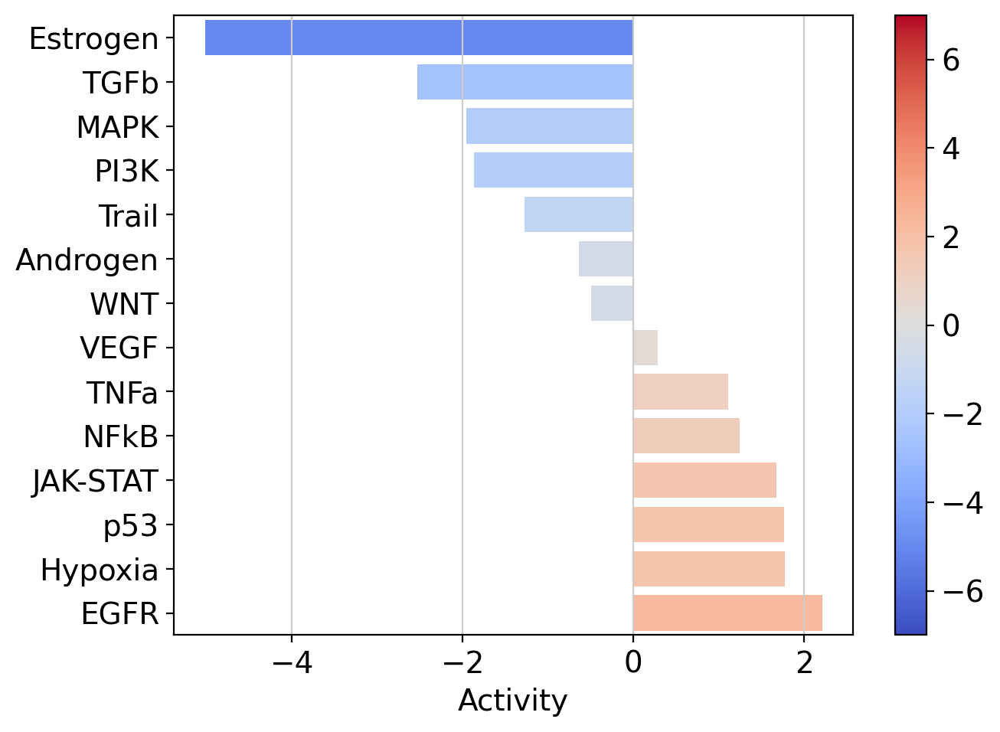

COPD Factor 6


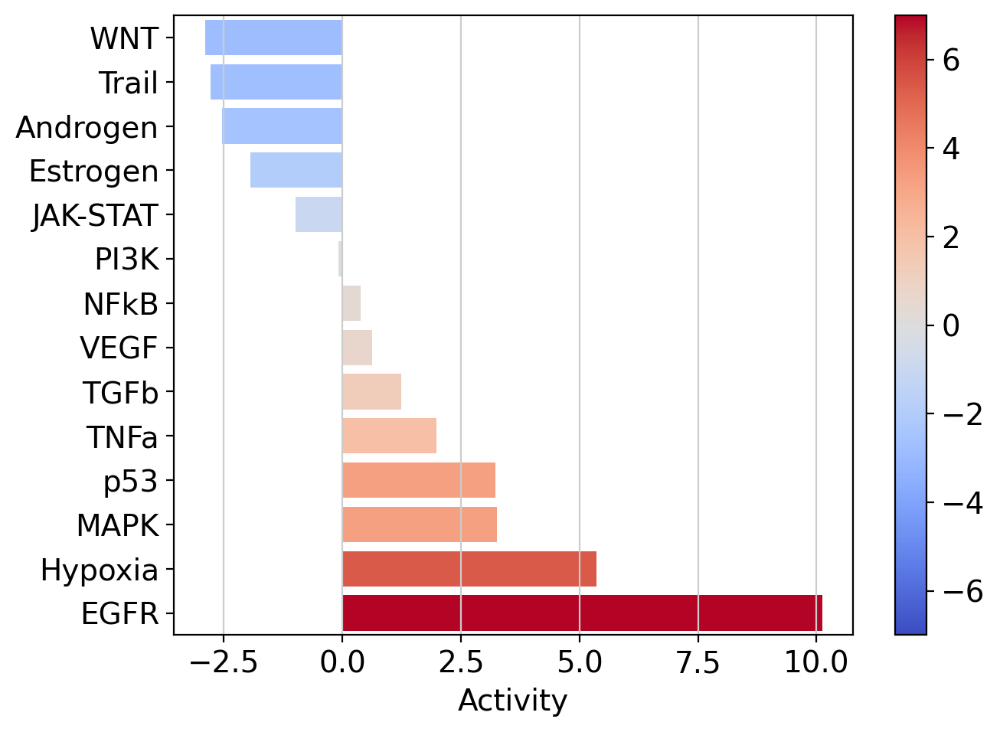

COPD Factor 7


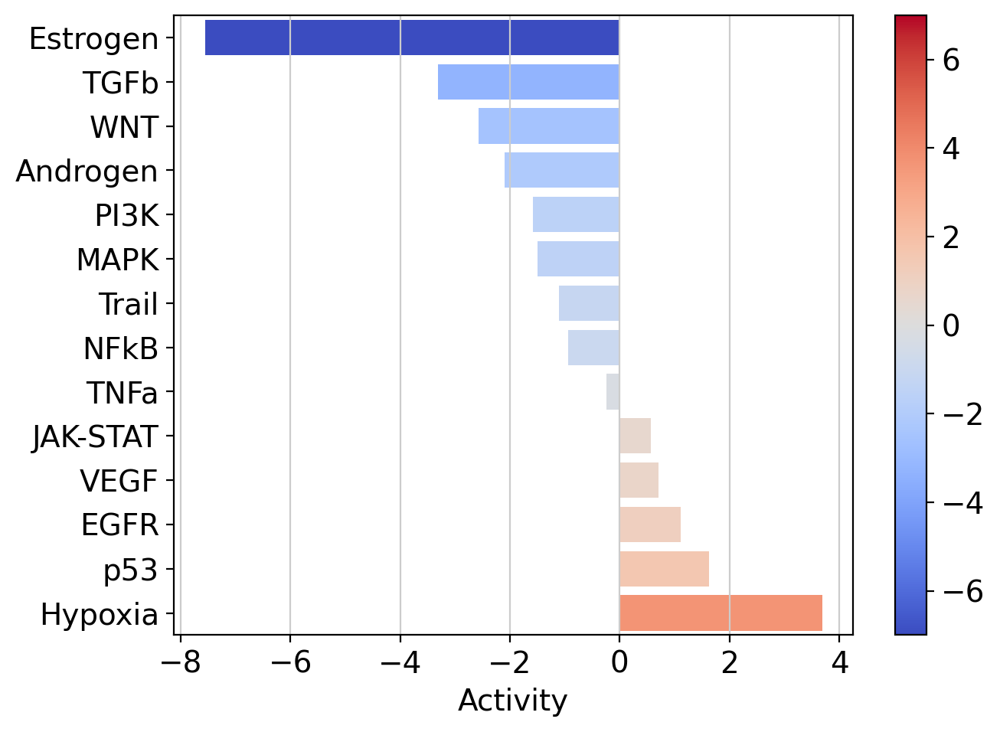

COPD Factor 8


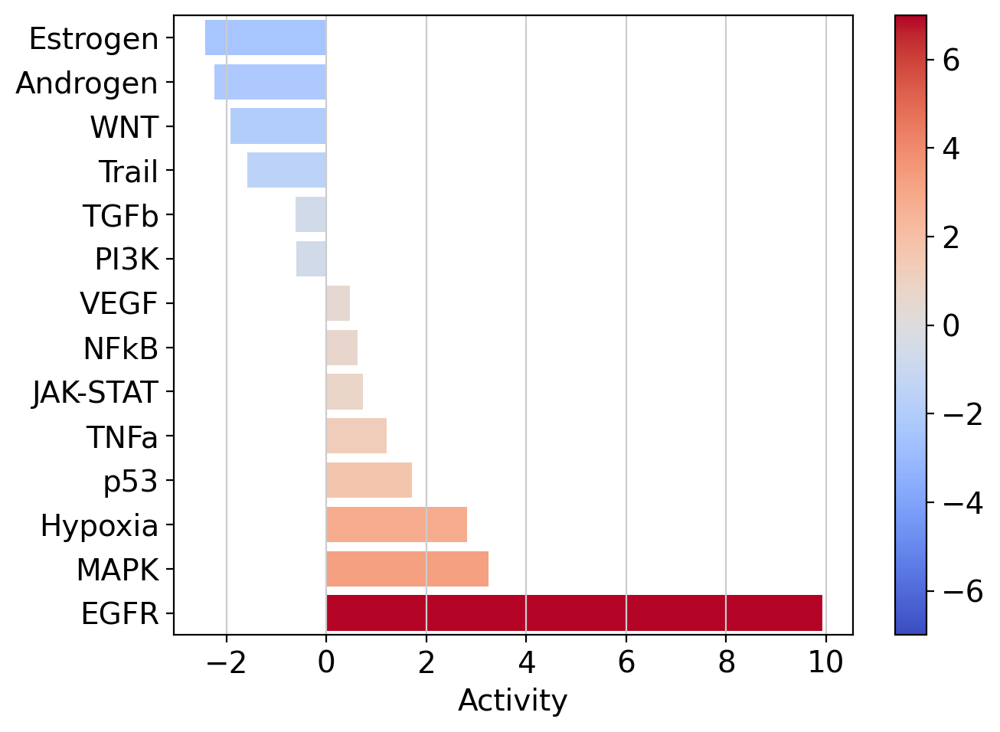

In [70]:
lr_pairs = li.resource.select_resource('consensus')
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
for condition, tensor in tensor_dict.items():
    lr_loadings = tensor.factors['Ligand-Receptor Pairs']
    estimate, pvals = dc.run_ulm(
        lr_loadings.transpose(),
        lr_progeny,
        source='source',
        target='interaction',
        use_raw=False,
    )
    factors = list(tensor.factors['Contexts'].columns)
    n_factors = len(factors)
    for i, factor in enumerate(factors):
        dc.plot_barplot(
            estimate, 
            factor, 
            vertical=True, 
            cmap='coolwarm', 
            vmin=-7, 
            vmax=7, 
        )
        plt.tight_layout()
        output_dir = figures_dir / 'loadings_barplot'
        output_dir.mkdir(exist_ok=True)
        plt.savefig(output_dir / f'loadings_barplot_{condition}_{factor}.svg')
        print(condition, factor)
        plt.show()

### GSEA enrichment

In [ ]:
for condition, tensor in tensor_dict.items():
    lr_loadings = tensor.factors['Ligand-Receptor Pairs']
    lr_list = ['^'.join(row) for idx, row in lr_pairs.iterrows()]
    lr_set = c2c.external.generate_lr_geneset(
        lr_list,
        complex_sep='_',
        lr_sep='^',
        organism='human',
        pathwaydb='Reactome',
        readable_name=True
    )
    pvals, scores, gsea_df = c2c.external.run_gsea(
        loadings=lr_loadings,
        lr_set=lr_set,
        output_folder=data_dir / f'GSEA_{condition}'
        weight=1,
        min_size=15,
        permuations=999,
        processes=6,
        random_state=6,
        significance_threshold=0.05,
    )

In [ ]:
lr_loadings_healthy = factors_healthy['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
output_folder = data_dir


In [ ]:
# Generate list with ligand-receptors pairs in DB
lr_list_H = ['^'.join(row) for idx, row in lr_pairs.iterrows()]
# Specify the organism and pathway database to use for building the LR set
organism = "human"
pathwaydb = "Reactome"
# Generate ligand-receptor gene sets
lr_set_H = c2c.external.generate_lr_geneset(lr_list_H,
complex_sep='_',
lr_sep='^',
organism=organism,
pathwaydb=pathwaydb,
readable_name=True
)

In [ ]:
pvals_H, scores_H, gsea_df_H = c2c.external.run_gsea(loadings=lr_loadings_healthy,
lr_set=lr_set_H,
output_folder=output_folder+'/GSEA_healthy',
weight=1,
min_size=15,
permutations=999,
processes=6,
random_state=6,
significance_threshold=0.05,
)

/mnt/LaCIE/ceger/Projects/COPD/COPD_influenza/6-cell-cell_comms/4-tensor/.data/GSEA_healthy was created successfully.


  0%|          | 0/7 [00:00<?, ?it/s]2024-09-16 11:21:23,320 [WARNING] Duplicated values found in preranked stats: 2.11% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
maxp pruned


cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 34 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'Y', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't']
Glyph IDs:   [0, 1, 2, 3, 36, 37, 38, 39, 40, 42, 44, 47, 49, 50, 51, 53, 54, 55, 56, 60, 68, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87]
Closed glyph list over 'GSUB': 34 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'Y', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't']
Glyph IDs:   [0, 1, 2, 3, 36, 37, 38, 39, 40, 42, 44, 47, 49, 50, 51, 53, 54, 55, 56, 60, 68, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87]
Closing glyph list over 'glyf': 34 glyphs bef

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 60 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'W', 'X', 'Y', 'Z', 'a', 'c', 'colon', 'd', 'e', 'equal', 'five', 'four', 'g', 'greater', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 11, 12, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 29, 32, 33, 36, 37, 38, 39

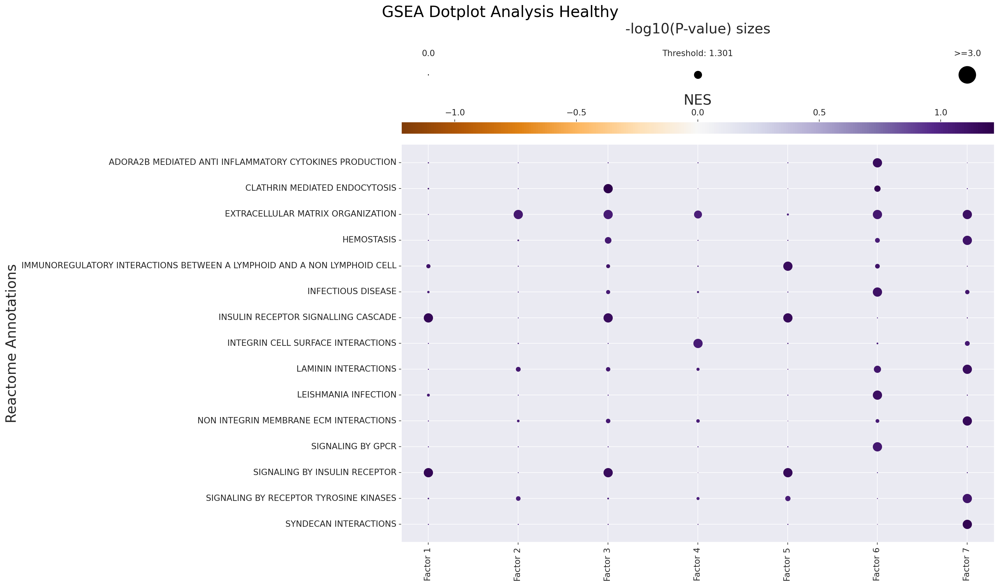

In [ ]:
pathway_label = '{} Annotations'.format(pathwaydb)
fig_filename = output_folder + '/GSEA-healthy-Dotplot.pdf'
with sns.axes_style("darkgrid"):
    dotplot = c2c.plotting.pval_plot.generate_dot_plot(pval_df=pvals_H,
    score_df=scores_H,
    significance=0.05,
    xlabel='',
    ylabel=pathway_label,
    cbar_title='NES',
    cmap='PuOr',
    figsize=(20, 12),
    label_size=20,
    title_size=20,
    tick_size=12,
    filename=fig_filename
    )

plt.suptitle("GSEA Dotplot Analysis Healthy", fontsize=22, y=0.97) 
plt.tight_layout()


Footprint enrichment with PROGENy

In [ ]:
lr_loadings_healthy = factors_healthy['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')
# generate ligand-receptor geneset
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
# run enrichment analysis
estimate_healthy, pvals_healthy = dc.run_ulm(lr_loadings_healthy.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:105: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:112: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the 

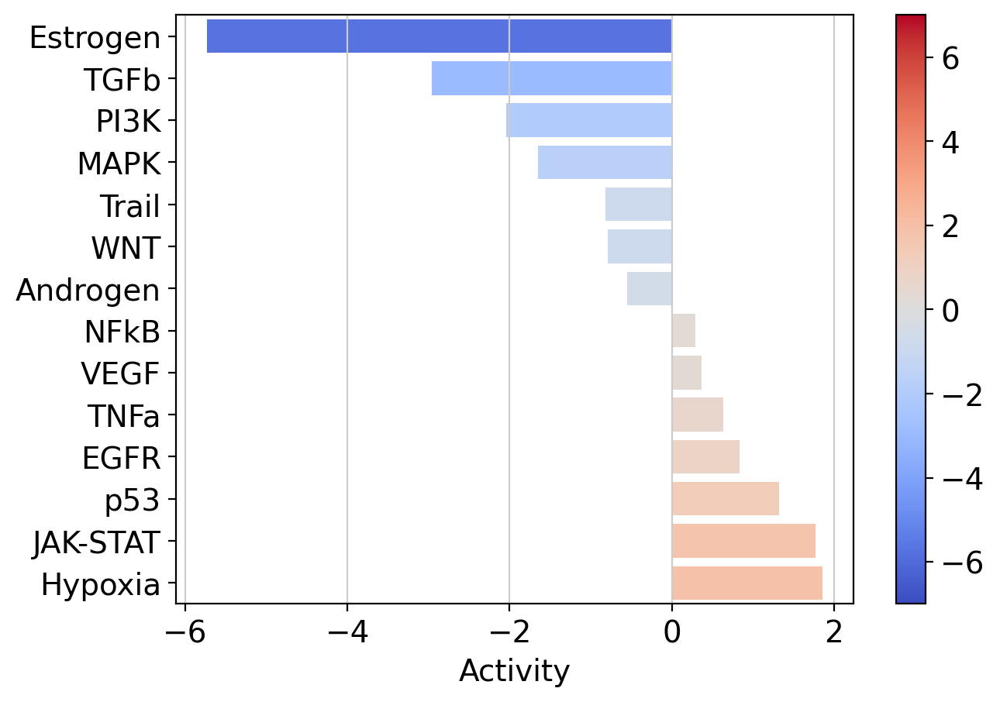

In [ ]:
dc.plot_barplot(estimate_healthy, 'Factor 4', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
plt.savefig(os.path.join(figure_dir, 'healthy_factor4_pathways.svg'))

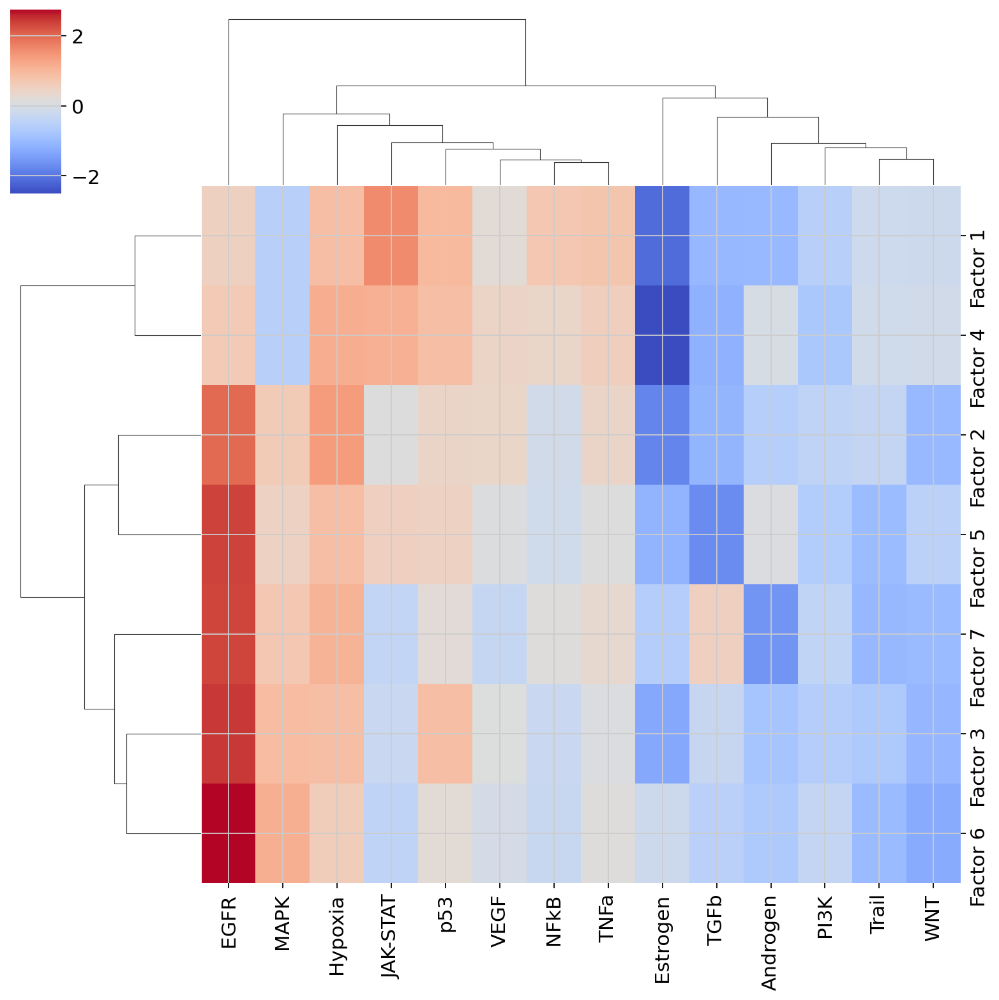

In [ ]:
sns.clustermap(estimate_healthy, xticklabels=estimate_healthy.columns, cmap='coolwarm', z_score=4)

In [ ]:
selected_factor = 'Factor 4'
pathways = ['EGFR', 'Hypoxia', 'JAK-STAT', 'p53']
for pathway in pathways:
    lr_loadings_long = lr_loadings_healthy.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
    lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
    lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
    lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

    (p9.ggplot(lr_loadings_long,
               p9.aes(x='weight', y='Loadings')) +
     p9.geom_smooth(method='lm') +
     p9.geom_point(p9.aes(colour='sign')) +
     p9.theme_bw() +
     p9.theme(legend_position='none') +
     p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
     p9.scale_colour_manual(values=["royalblue", "red"]) +
     p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
     p9.xlim(-1, 8.5)
     ).save(os.path.join(figure_dir, f'healthy_{selected_factor.replace(" ", "_")}_{pathway}_loadings.svg'))

/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:604: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:605: PlotnineWarning: Filename: /mnt/LaCIE/ceger/Projects/COPD/COPD_influenza/6-cell-cell_comms/4-tensor/.data/figures/healthy_Factor_4_EGFR_loadings.svg
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 15 rows containing missing values.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 72 rows containing missing values.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:604: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:605: PlotnineWarning: Filename: /mnt/LaCIE/ceger

In [ ]:
'hi hi'.replace(' ', '_')

'hi_hi'

### COPD

In [ ]:
# Path
file_name = 'final_tensor_compartment_COPD.pkl'
file_path = os.path.join(data_dir, file_name)
# Load
tensor_COPD = unpickle_gpu_tensor(file_path, 'cpu')
tensor_COPD

In [ ]:
factors_COPD = tensor_COPD.factors
factors_COPD.keys()

odict_keys(['Contexts', 'Ligand-Receptor Pairs', 'Sender Cells', 'Receiver Cells'])

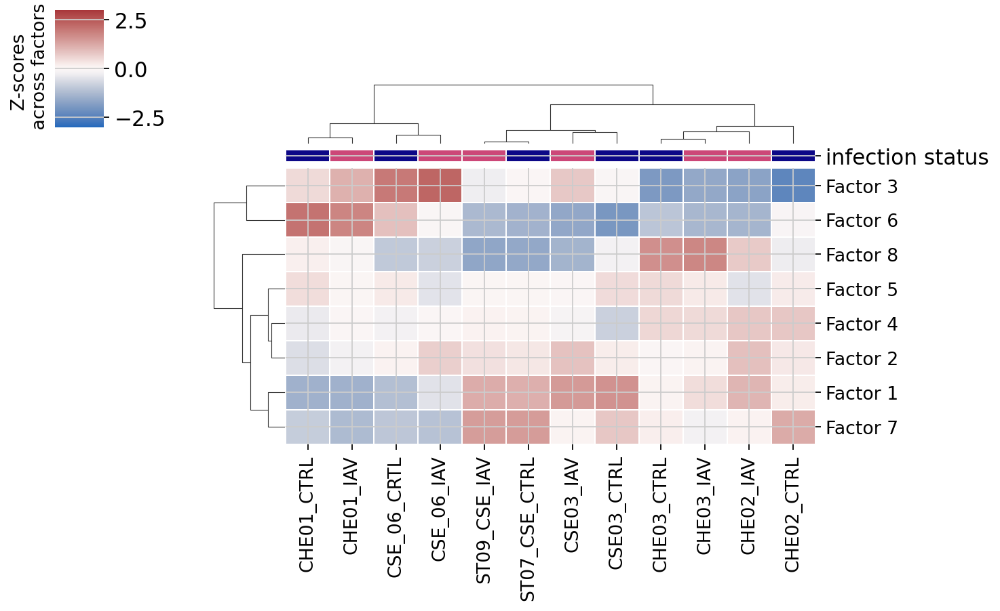

In [ ]:
c2c.plotting.loading_clustermap(factors_COPD['Contexts'],
                                use_zscore=True, # Whether standardizing the loadings across factors
                                loading_threshold= 0,
                                col_colors=col_colors, # Change this to color by other properties
                                figsize=(9, 6),
                                dendrogram_ratio=0.3,
                                cbar_fontsize=12,
                                tick_fontsize=12
                                )

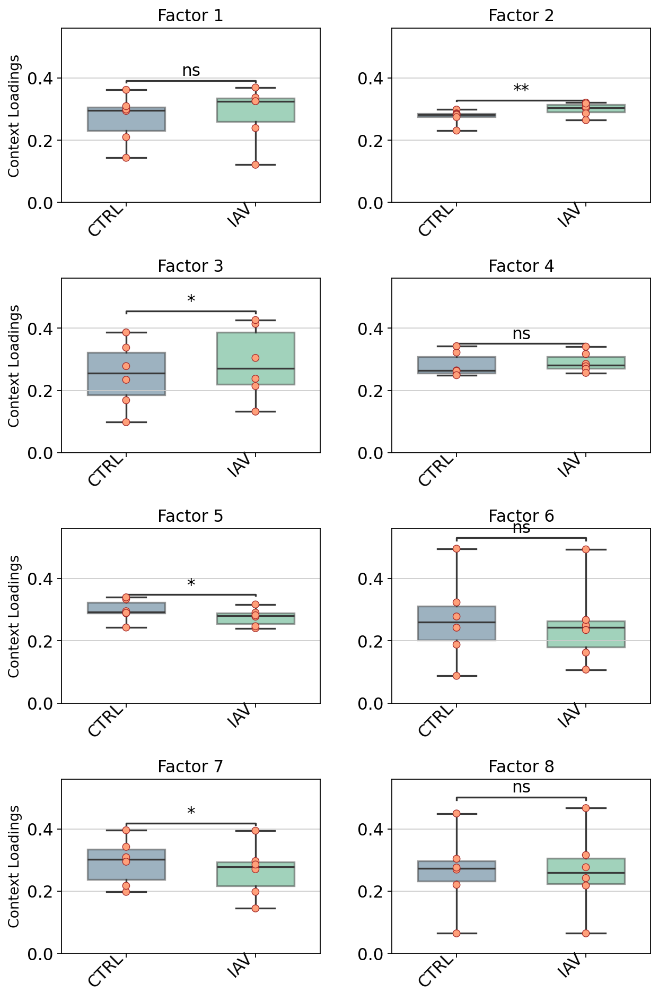

In [ ]:
fig = c2c.plotting.factor_plot.context_boxplot(
    factors_COPD['Contexts'],
    metadict=context_dict,
    group_label_rotation=45,
    nrows=4,
    figsize=(8, 12),
    group_order=['CTRL', 'IAV'],
    statistical_test='t-test_paired',
    pval_correction='BH',
    verbose=False,
    cmap='viridis',
    ylabel="Context Loadings",
    text_format='star'
)
for ax in fig[0].axes:
    ax.set_ylim(0, 0.56)  # Set y-axis limits from 0 to 0.5
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, 'factor_plot_copd.svg'))
plt.show()

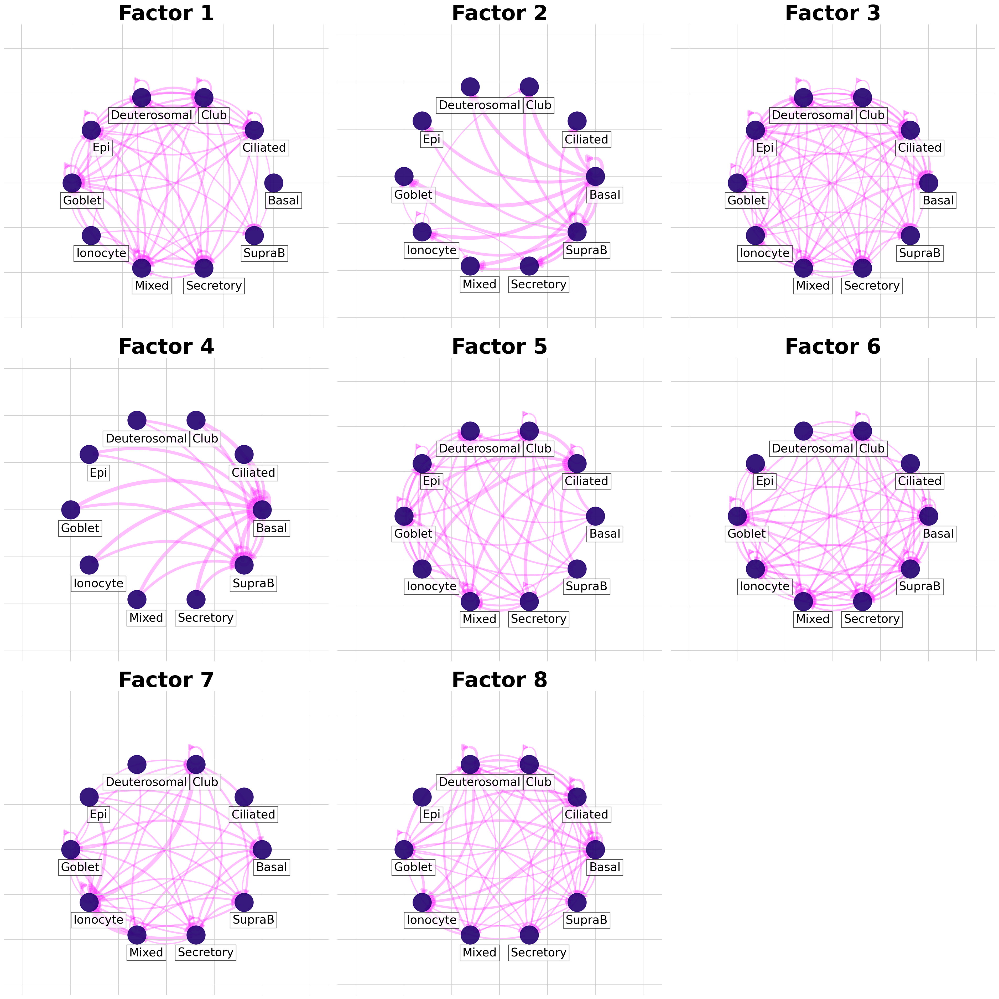

In [ ]:
c2c.plotting.ccc_networks_plot(factors_COPD,
                               included_factors=['Factor 1','Factor 2', 'Factor 3','Factor 4','Factor 5', 'Factor 6', 'Factor 7', 'Factor 8'],
                               network_layout='circular',
                               ccc_threshold=0.07, # Only important communication
                               nrows=3,
                               panel_size=(8, 8), # This changes the size of each figure panel.
                              )
plt.savefig(os.path.join(figure_dir, 'circos_copd.svg'))

GSEA enrichment analysis

In [ ]:
lr_loadings_COPD = factors_COPD['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
output_folder = data_dir


In [ ]:
# Generate list with ligand-receptors pairs in DB
lr_list = ['^'.join(row) for idx, row in lr_pairs.iterrows()]
# Specify the organism and pathway database to use for building the LR set
organism = "human"
pathwaydb = "Reactome"
# Generate ligand-receptor gene sets
lr_set = c2c.external.generate_lr_geneset(lr_list,
complex_sep='_',
lr_sep='^',
organism=organism,
pathwaydb=pathwaydb,
readable_name=True
)

In [ ]:
pvals, scores, gsea_df = c2c.external.run_gsea(loadings=lr_loadings_COPD,
lr_set=lr_set,
output_folder=output_folder+'/GSEA_COPD',
weight=1,
min_size=15,
permutations=999,
processes=6,
random_state=6,
significance_threshold=0.05,
)

/mnt/LaCIE/ceger/Projects/COPD/COPD_influenza/6-cell-cell_comms/4-tensor/.data/GSEA_COPD was created successfully.


  0%|          | 0/8 [00:00<?, ?it/s]2024-09-16 11:21:45,200 [WARNING] Duplicated values found in preranked stats: 3.54% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 32 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't']
Glyph IDs:   [0, 1, 2, 3, 36, 37, 38, 39, 40, 42, 44, 47, 49, 50, 51, 53, 54, 55, 68, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87]
Closed glyph list over 'GSUB': 32 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'G', 'I', 'L', 'N', 'O', 'P', 'R', 'S', 'T', 'a', 'c', 'd', 'e', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four gly

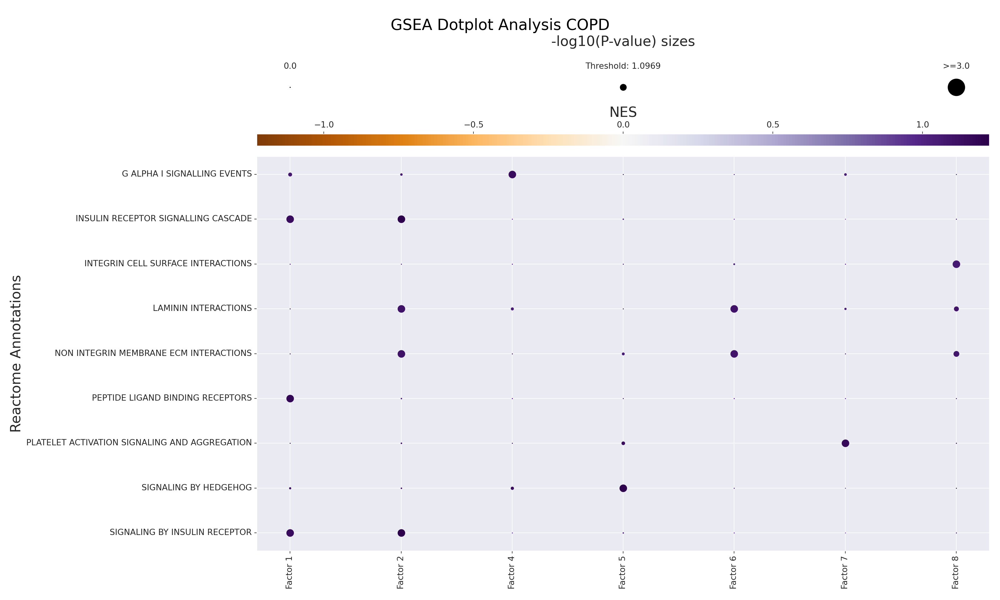

In [ ]:
pathway_label = '{} Annotations'.format(pathwaydb)
fig_filename = output_folder + '/GSEA-COPD-Dotplot.pdf'
with sns.axes_style("darkgrid"):
    dotplot = c2c.plotting.pval_plot.generate_dot_plot(pval_df=pvals,
    score_df=scores,
    significance=0.08,
    xlabel='',
    ylabel=pathway_label,
    cbar_title='NES',
    cmap='PuOr',
    figsize=(20, 12),
    label_size=20,
    title_size=20,
    tick_size=12,
    filename=fig_filename
    )

plt.suptitle("GSEA Dotplot Analysis COPD", fontsize=22, y=0.97) 
plt.tight_layout()

Footprint enrichment analysis with PROGENy

In [ ]:
lr_loadings_COPD = factors_COPD['Ligand-Receptor Pairs']
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')
# generate ligand-receptor geneset
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
# run enrichment analysis
estimate_COPD, pvals_COPD = dc.run_ulm(lr_loadings_COPD.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:105: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:112: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the 

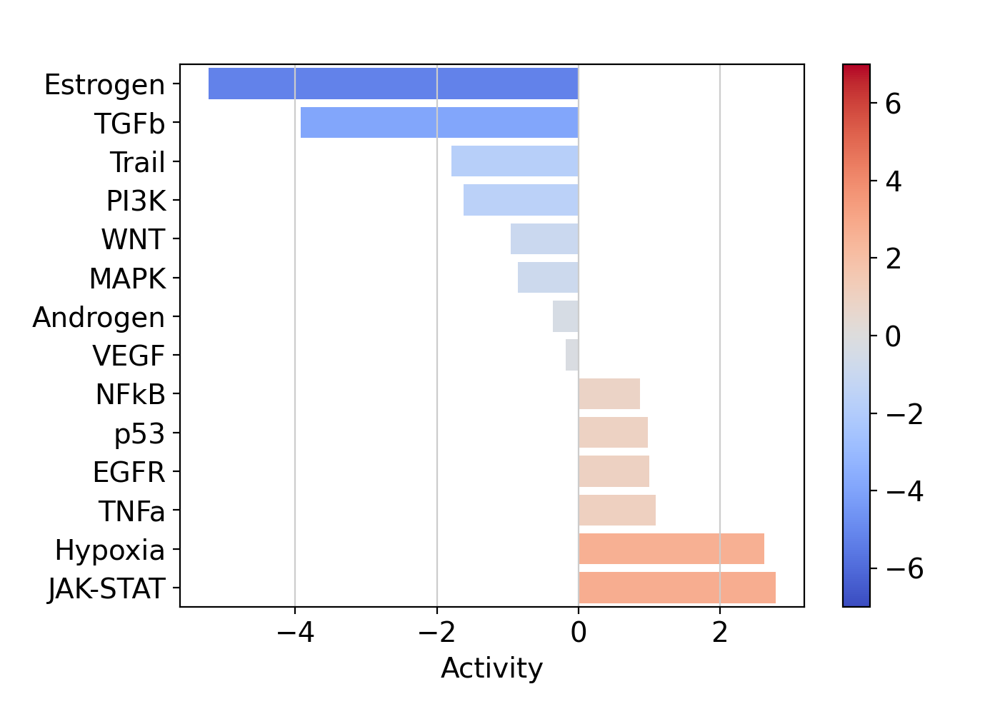

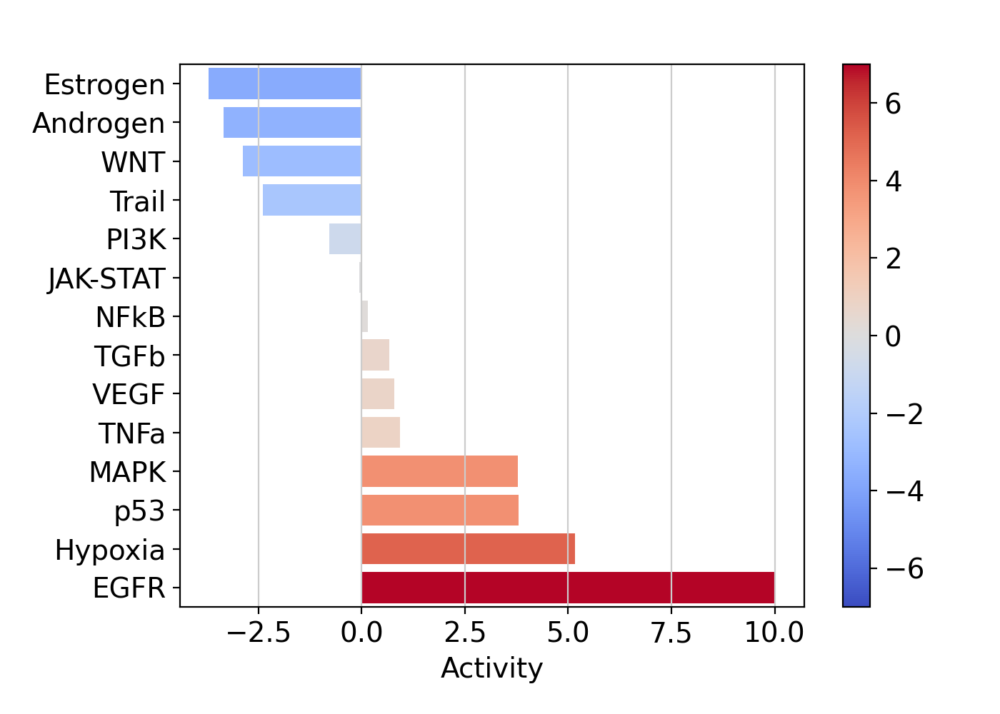

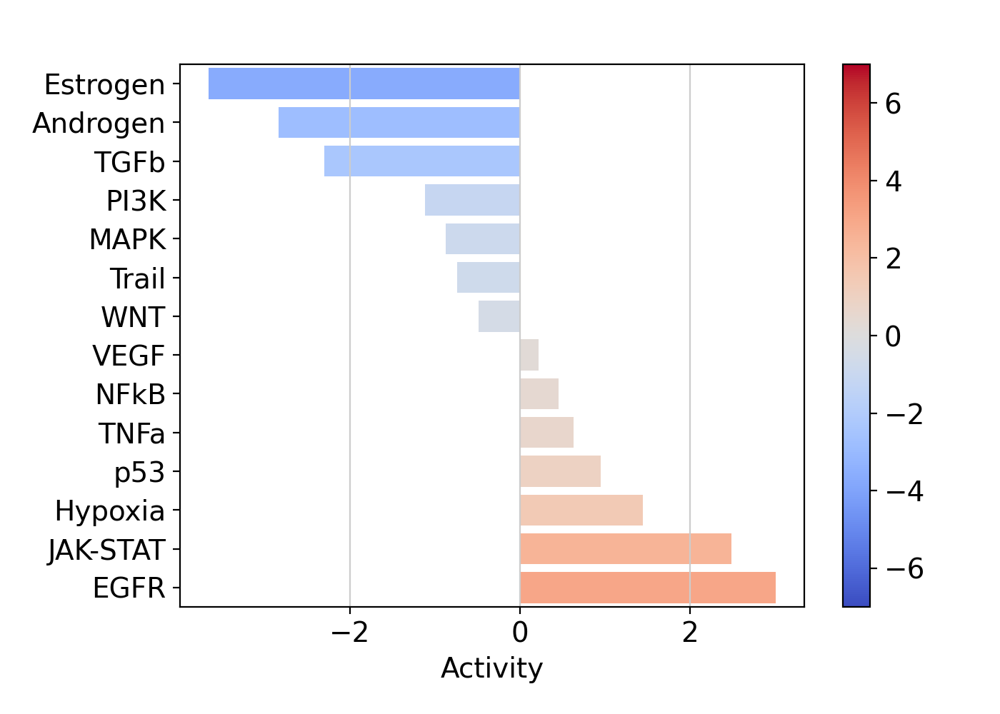

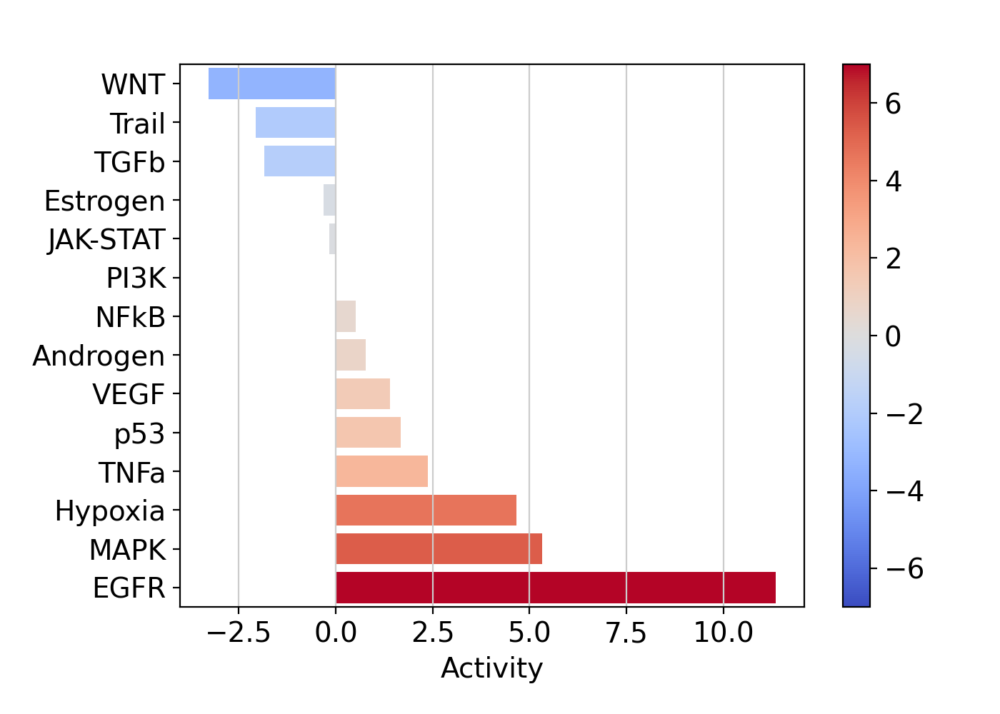

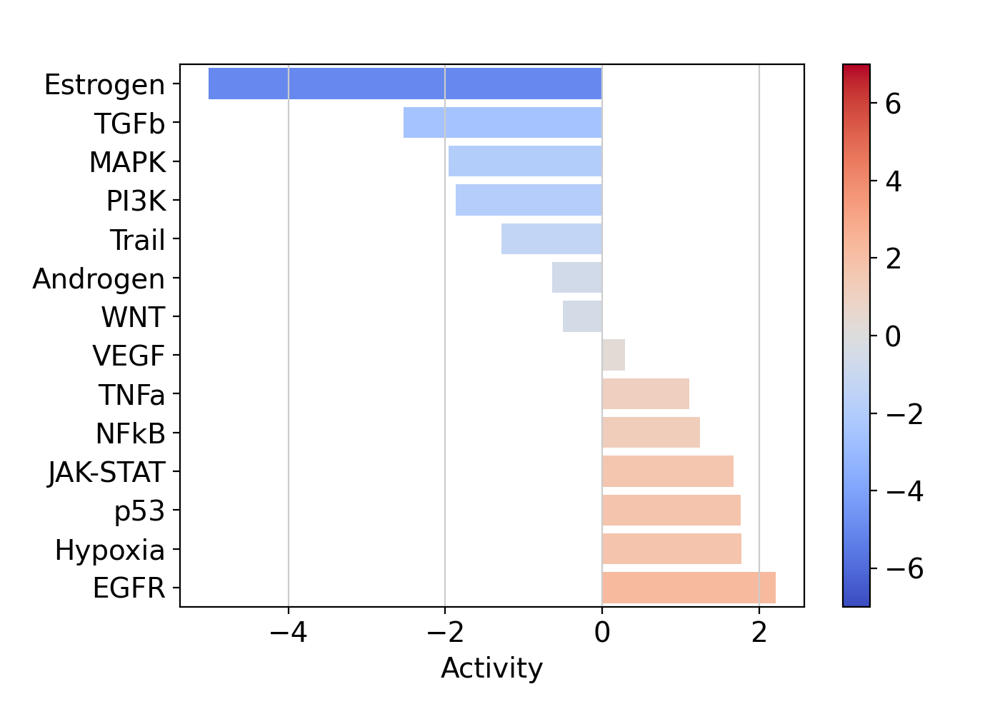

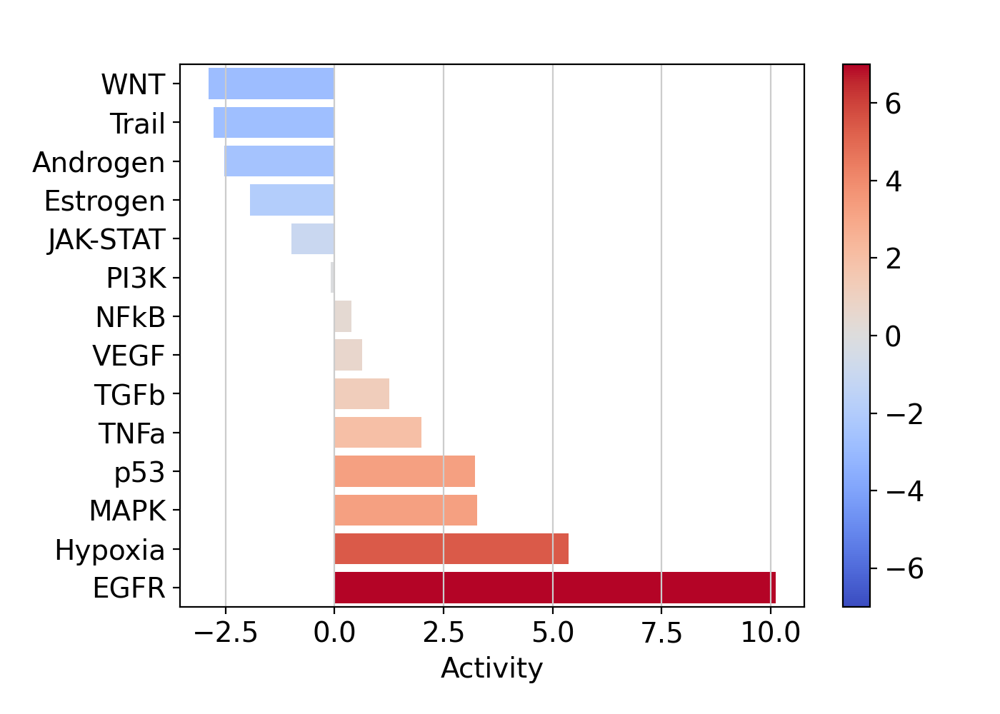

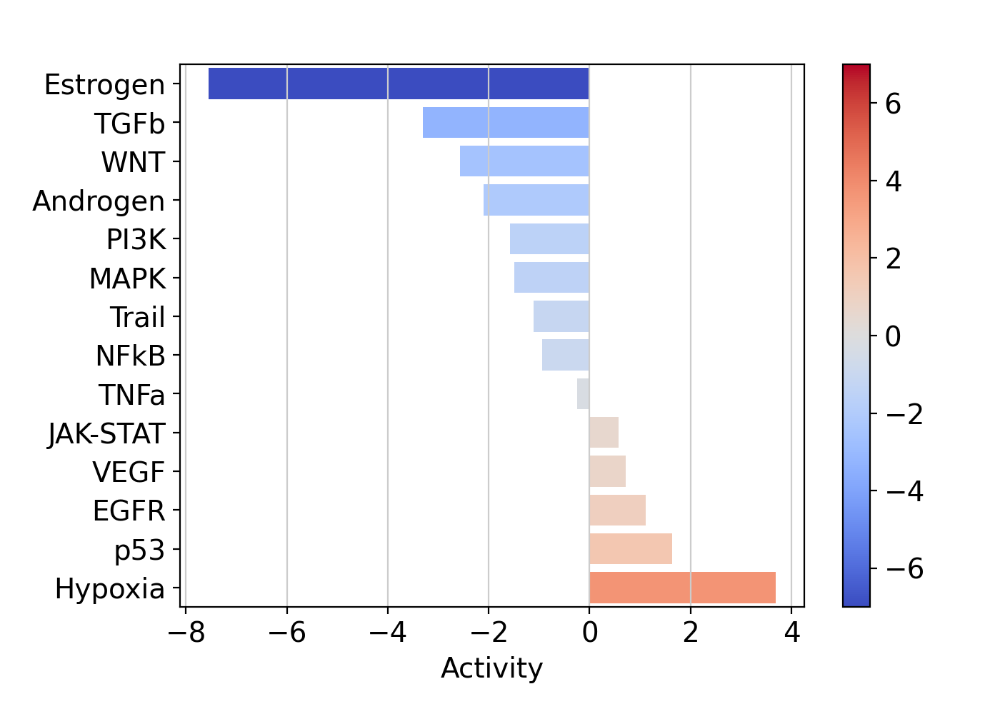

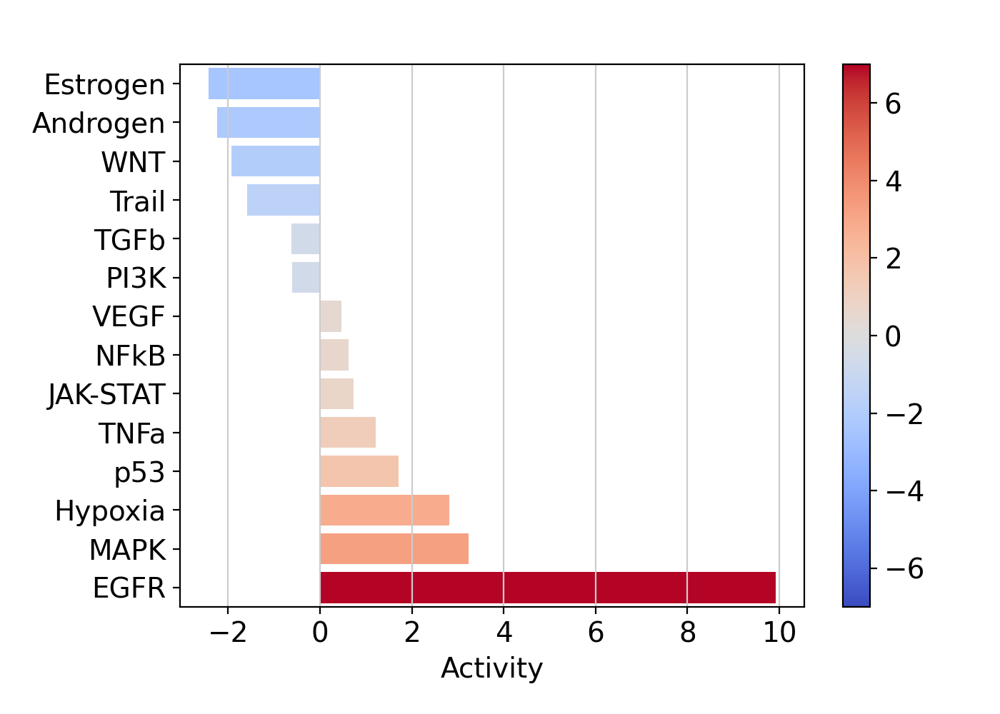

In [ ]:
dc.plot_barplot(estimate_COPD, 'Factor 1', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 2', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 3', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 4', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 5', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 6', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 7', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate_COPD, 'Factor 8', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)

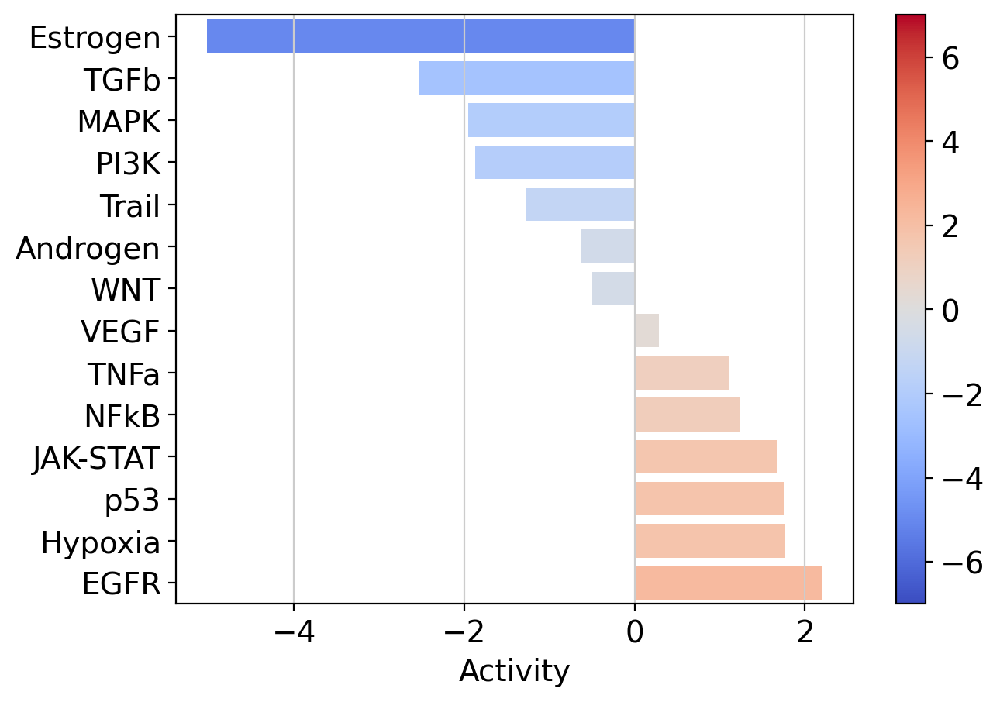

In [ ]:
dc.plot_barplot(estimate_COPD, 'Factor 5', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
plt.savefig(os.path.join(figure_dir, 'healthy_factor5_pathways.svg'))

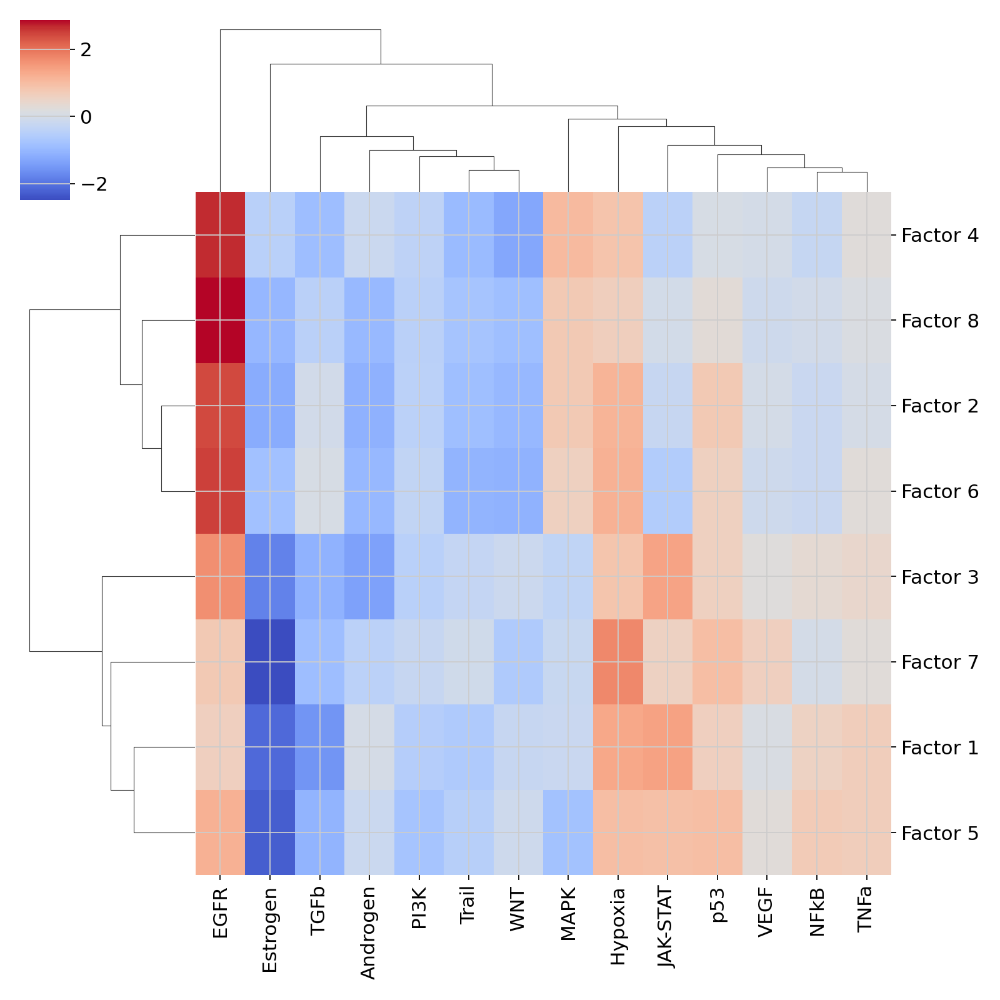

In [ ]:
sns.clustermap(estimate_COPD, xticklabels=estimate_healthy.columns, cmap='coolwarm', z_score=4)

In [ ]:
selected_factor = 'Factor 5'
pathways = ['EGFR', 'Hypoxia', 'JAK-STAT', 'p53']
for pathway in pathways:
    lr_loadings_long = lr_loadings_COPD.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
    lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
    lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
    lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

    (p9.ggplot(lr_loadings_long,
               p9.aes(x='weight', y='Loadings')) +
     p9.geom_smooth(method='lm') +
     p9.geom_point(p9.aes(colour='sign')) +
     p9.theme_bw() +
     p9.theme(legend_position='none') +
     p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
     p9.scale_colour_manual(values=["royalblue", "red"]) +
     p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
     p9.xlim(-1, 8.5)
     ).save(os.path.join(figure_dir, f'COPD_{selected_factor.replace(" ", "_")}_{pathway}_loadings.svg'))

/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:604: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:605: PlotnineWarning: Filename: /mnt/LaCIE/ceger/Projects/COPD/COPD_influenza/6-cell-cell_comms/4-tensor/.data/figures/COPD_Factor_5_EGFR_loadings.svg
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 15 rows containing missing values.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 67 rows containing missing values.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:604: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/ceger/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/plotnine/ggplot.py:605: PlotnineWarning: Filename: /mnt/LaCIE/ceger/Pr

### Comparison of the most similar Factors in both Groups

In [ ]:
tensor_healthy

In [ ]:
def in_and_out_factor_table(dict_df):
    df_in = dict_df['Receiver Cells'].copy()
    df_out = dict_df['Sender Cells'].copy()
    df_in.index = df_in.index + '_in'
    df_out.index = df_out.index + '_out'
    return pd.concat((df_in, df_out))

In [ ]:
factors_healthy['Receiver and Sender Cells'] = in_and_out_factor_table(factors_healthy)
factors_COPD['Receiver and Sender Cells'] = in_and_out_factor_table(factors_COPD)

In [ ]:
def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    return dot_product / (norm_vec1 * norm_vec2)

factor_metrics = ['Contexts', 'Sender Cells', 'Receiver Cells', 'Receiver and Sender Cells']

metric_sims = {}
for metric in factor_metrics:
    print(f'comparing for metric {metric}')
    factor_metric_values_healthy = factors_healthy[metric]
    factor_metric_values_COPD = factors_COPD[metric]
    factors_healthy_name = factor_metric_values_healthy.columns
    factors_COPD_name = factor_metric_values_COPD.columns
    similarities = pd.DataFrame(index=factor_metric_values_healthy.columns, columns=factor_metric_values_COPD.columns)
    for healthy_factor_name in factors_healthy_name:
        for COPD_factor_name in factors_COPD_name:
            factor_values_healthy = factor_metric_values_healthy[healthy_factor_name]
            factor_values_COPD = factor_metric_values_COPD[COPD_factor_name]
            cosine_sim = cosine_similarity(factor_values_healthy, factor_values_COPD)
            similarities.loc[healthy_factor_name, COPD_factor_name] = cosine_sim
    metric_sims[metric] = similarities
 
    

comparing for metric Contexts
comparing for metric Sender Cells
comparing for metric Receiver Cells
comparing for metric Receiver and Sender Cells


In [ ]:
def find_max_values(df):
    max_values = df.max(axis=1)
    max_indices = df.idxmax(axis=1)
    result = pd.DataFrame({'Max Value': max_values, 'Row Index': max_indices})
    return result

In [ ]:
metric = 'Contexts'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.993249,Factor 5
Factor 2,0.991257,Factor 2
Factor 3,0.993517,Factor 2
Factor 4,0.986862,Factor 2
Factor 5,0.987531,Factor 2
Factor 6,0.974365,Factor 4
Factor 7,0.969488,Factor 8


In [ ]:
metric = 'Sender Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.986524,Factor 3
Factor 2,0.994617,Factor 7
Factor 3,0.988483,Factor 2
Factor 4,0.986683,Factor 5
Factor 5,0.889112,Factor 1
Factor 6,0.988726,Factor 4
Factor 7,0.922994,Factor 6


In [ ]:
metric = 'Receiver Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.986044,Factor 1
Factor 2,0.905128,Factor 7
Factor 3,0.994492,Factor 2
Factor 4,0.983794,Factor 5
Factor 5,0.997489,Factor 2
Factor 6,0.939278,Factor 4
Factor 7,0.988748,Factor 2


In [ ]:
metric = 'Receiver and Sender Cells'
metric_sims[metric] = metric_sims[metric].apply(pd.to_numeric, errors='coerce')
# Get the result
result = find_max_values(metric_sims[metric])
result

,Max Value,Row Index
Factor 1,0.972863,Factor 1
Factor 2,0.949872,Factor 7
Factor 3,0.991488,Factor 2
Factor 4,0.985239,Factor 5
Factor 5,0.922684,Factor 1
Factor 6,0.964002,Factor 4
Factor 7,0.932069,Factor 8


Factor 6 from healthy and Factor 4 from COPD patients appears very similar

### Boxplots

Factor 1 Factor 1
Factor 2 Factor 7
Factor 3 Factor 2
Factor 4 Factor 5
Factor 5 Factor 1
Factor 6 Factor 4
Factor 7 Factor 8


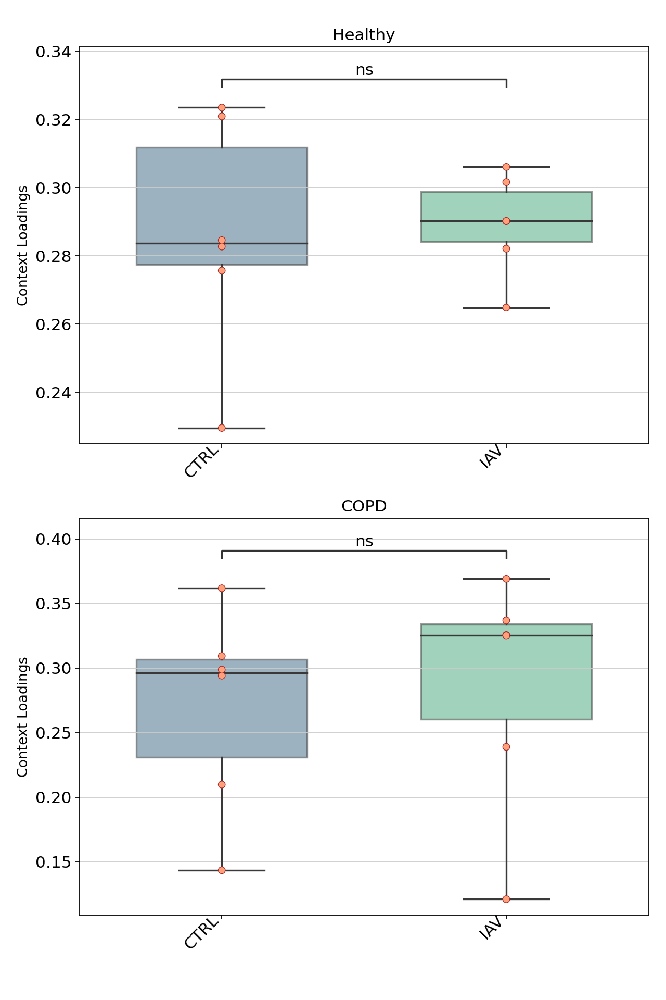

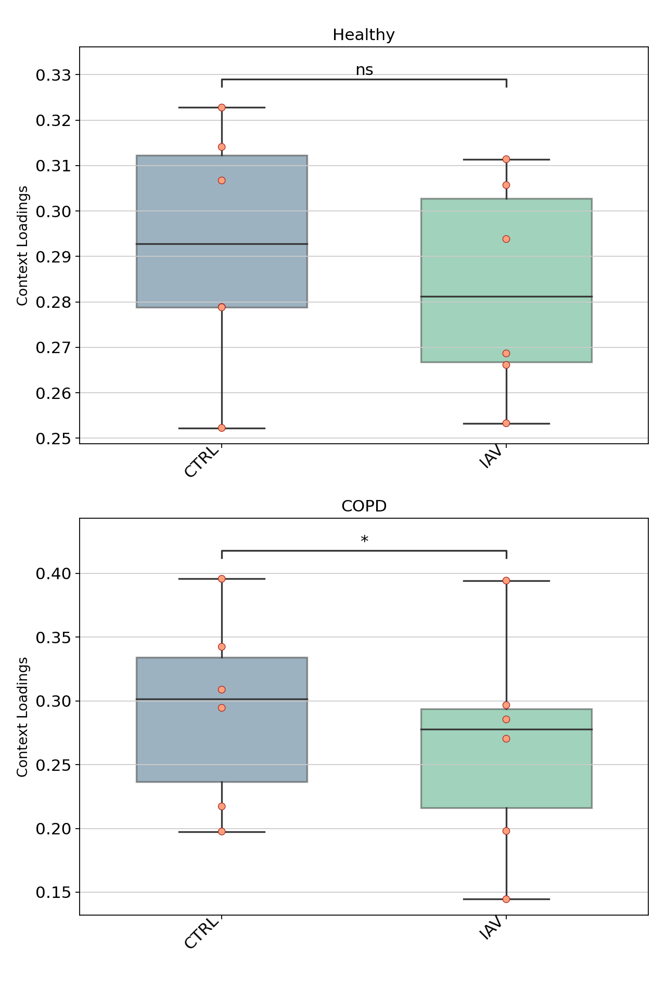

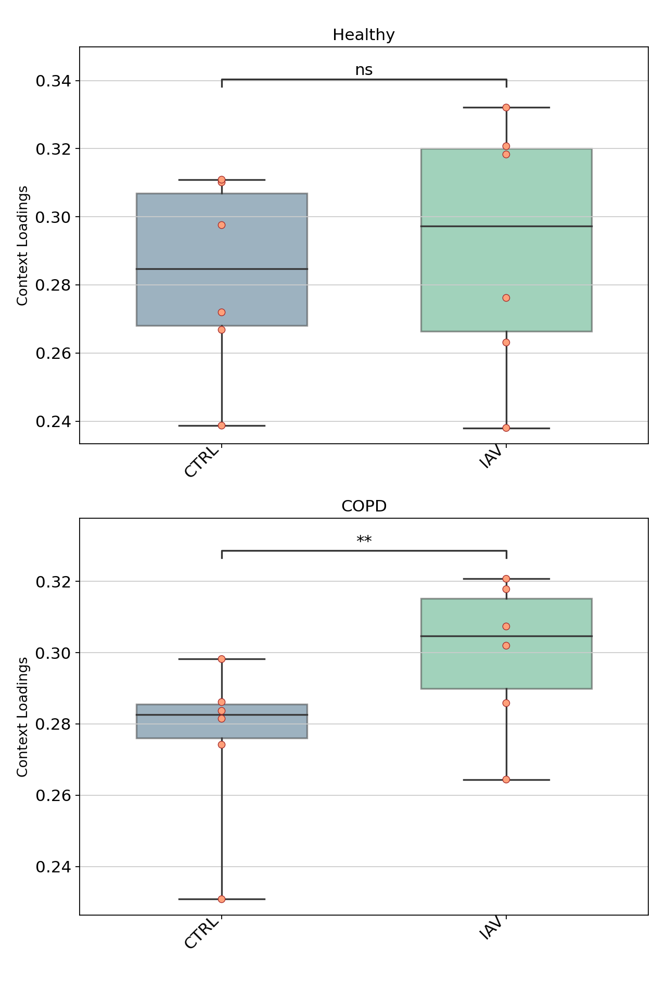

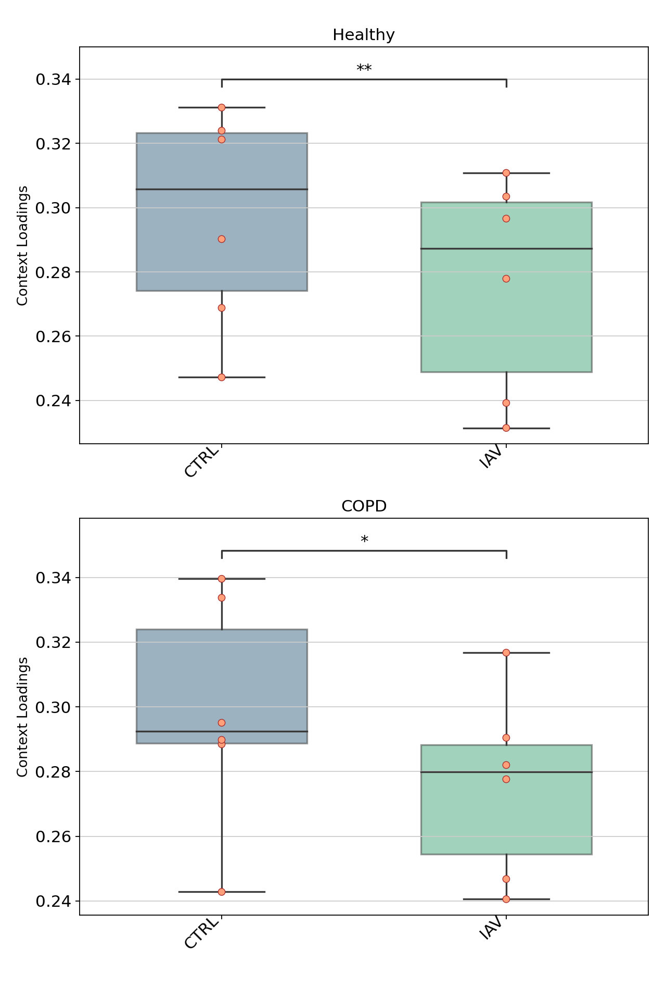

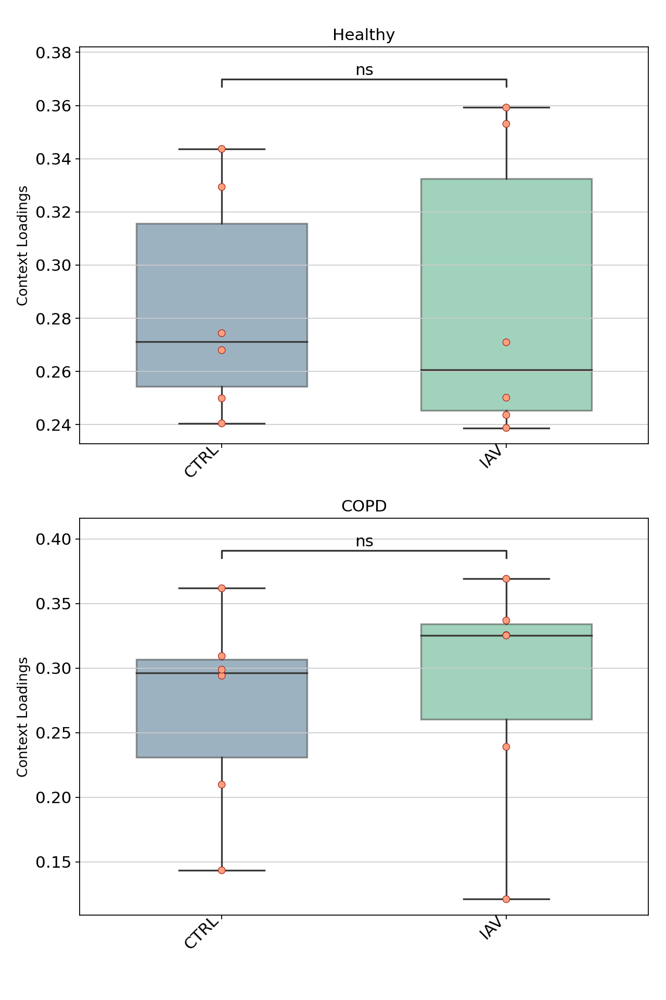

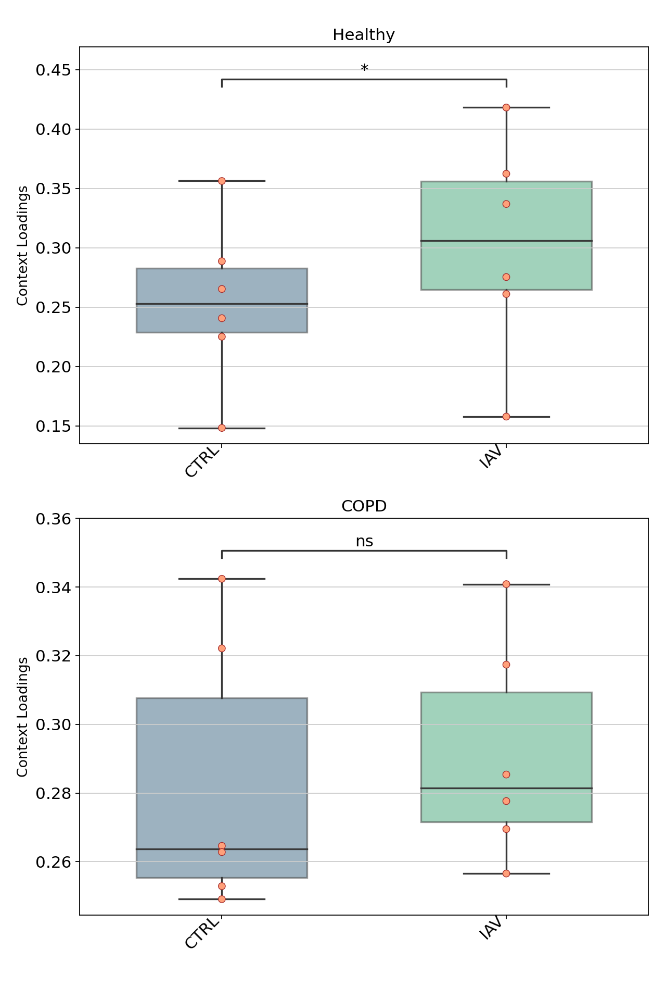

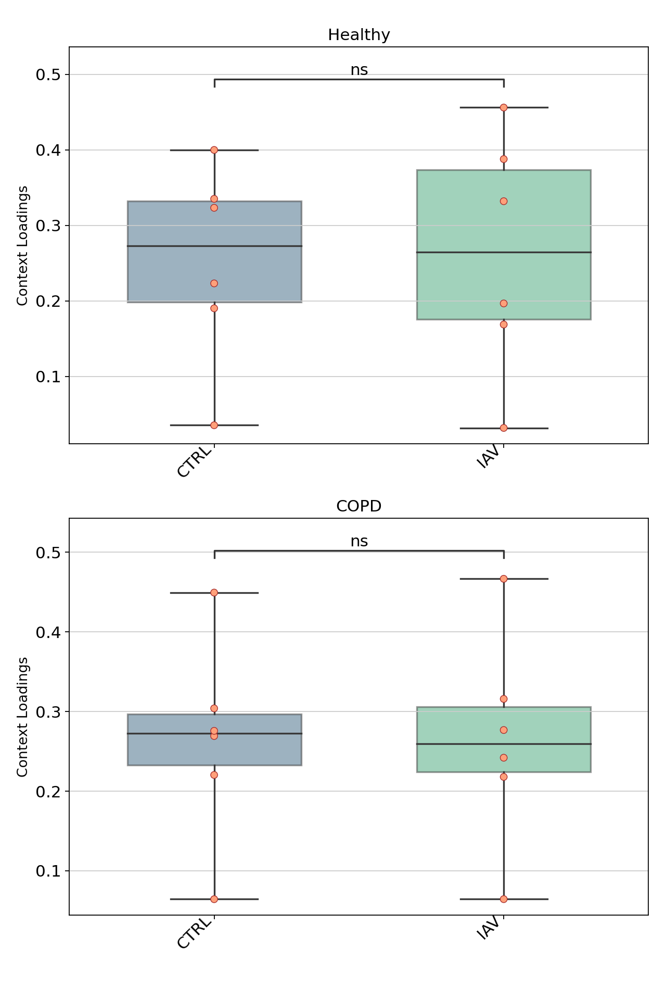

In [ ]:
for row in result.iterrows():
    healthy_factor_values = factors_healthy['Contexts'][row[1].name]
    COPD_factor_values = factors_COPD['Contexts'][row[1]['Row Index']]
    index = list(factors_healthy['Contexts'].index ) + list(factors_COPD['Contexts'].index)
    concatenated_df = pd.DataFrame(index=index)
    concatenated_df['Healthy'] = healthy_factor_values
    print(row[1].name, row[1]['Row Index'])
    concatenated_df['COPD'] = COPD_factor_values
    c2c.plotting.factor_plot.context_boxplot(concatenated_df,
                            metadict=context_dict,
                            group_label_rotation= 45,
                            nrows=4,
                            figsize=(8, 12),
                            group_order=['CTRL', 'IAV'],
                            statistical_test='t-test_paired',
                            pval_correction='BH',
                            verbose=False,
                            cmap='viridis',
                            ylabel="Context Loadings",
                            text_format='star',
                            )

### Circos Plots

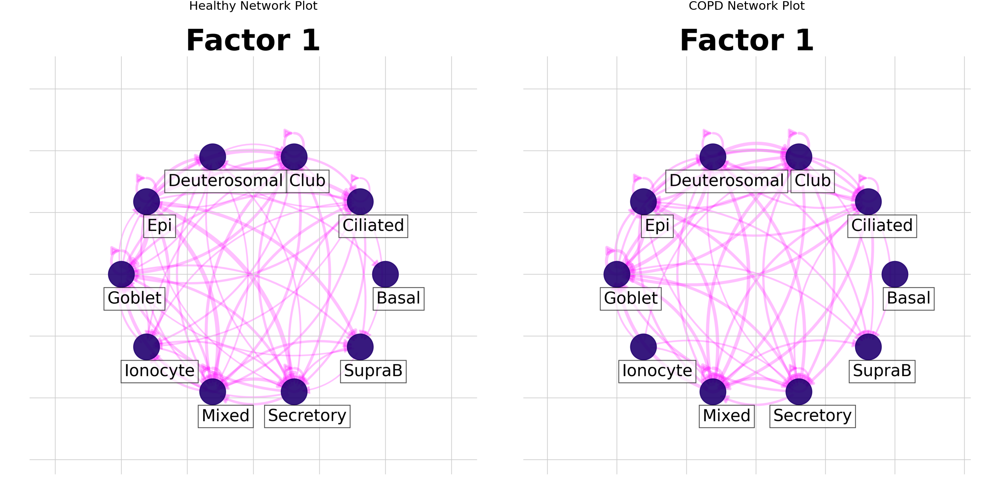

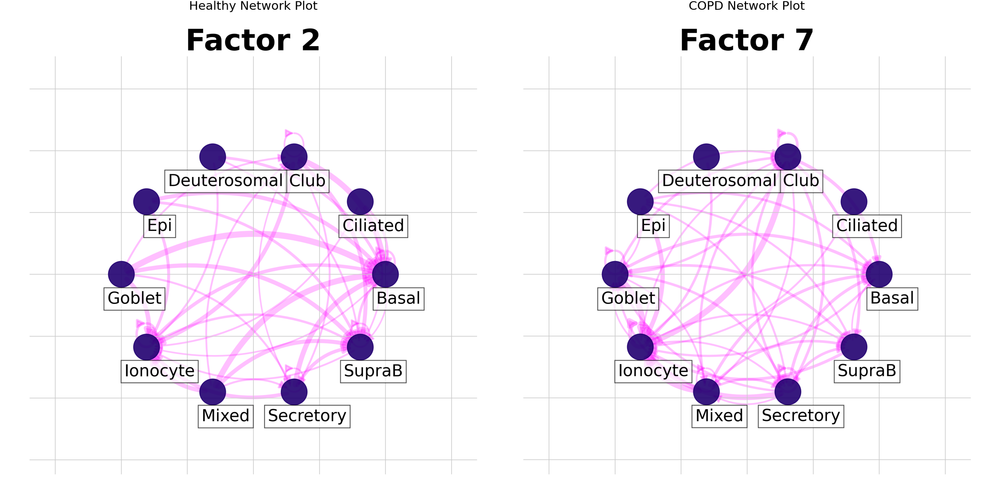

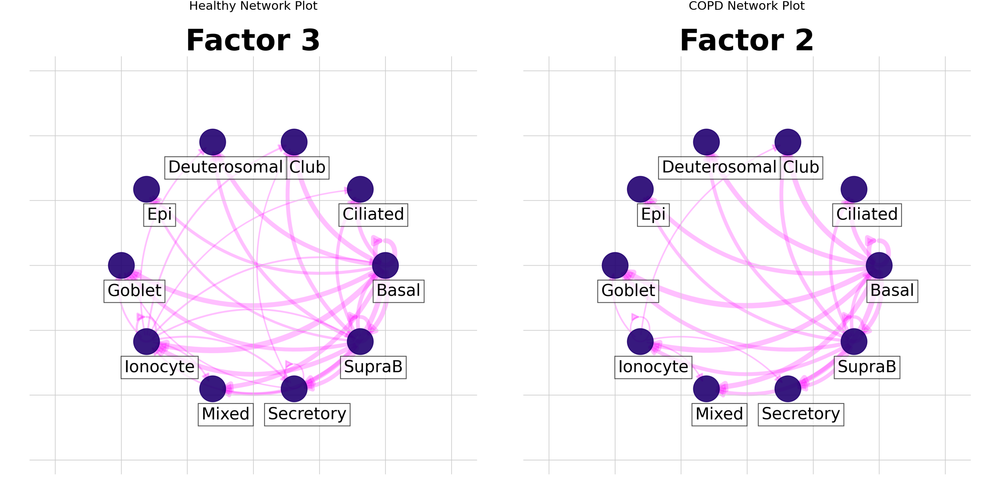

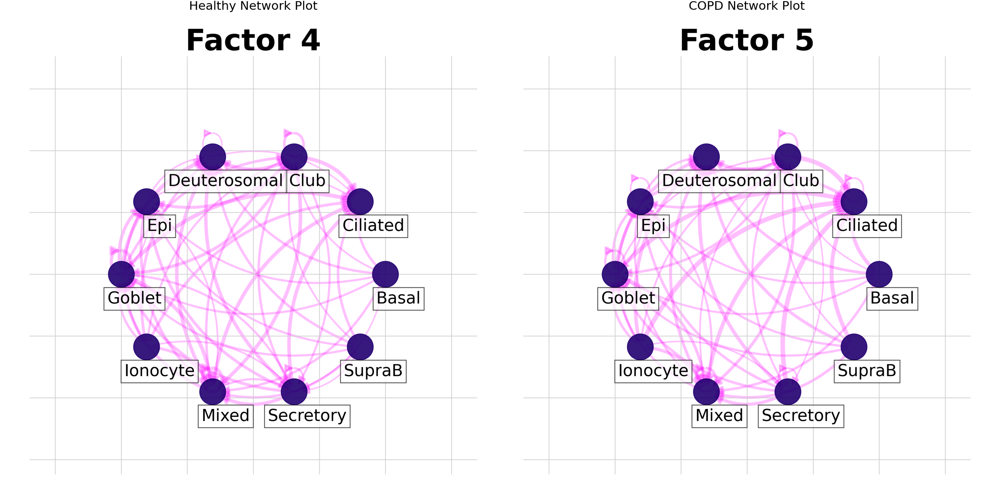

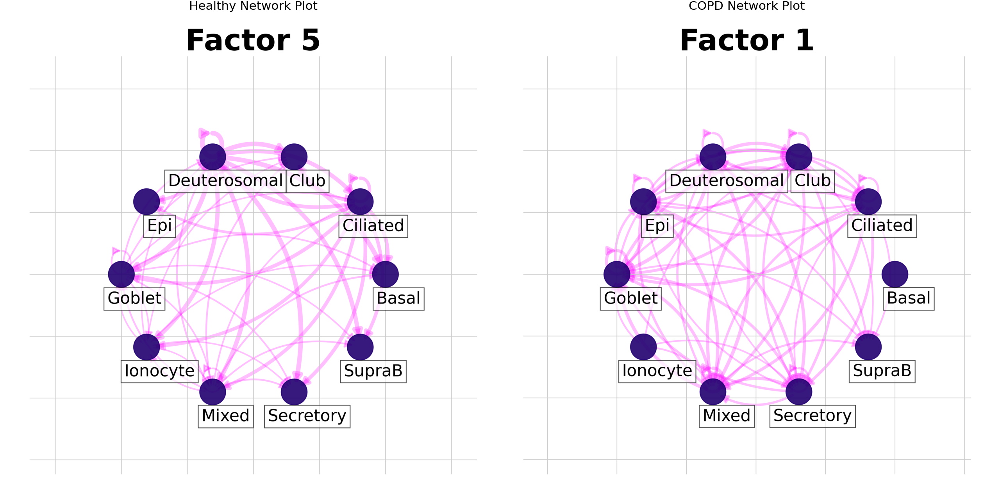

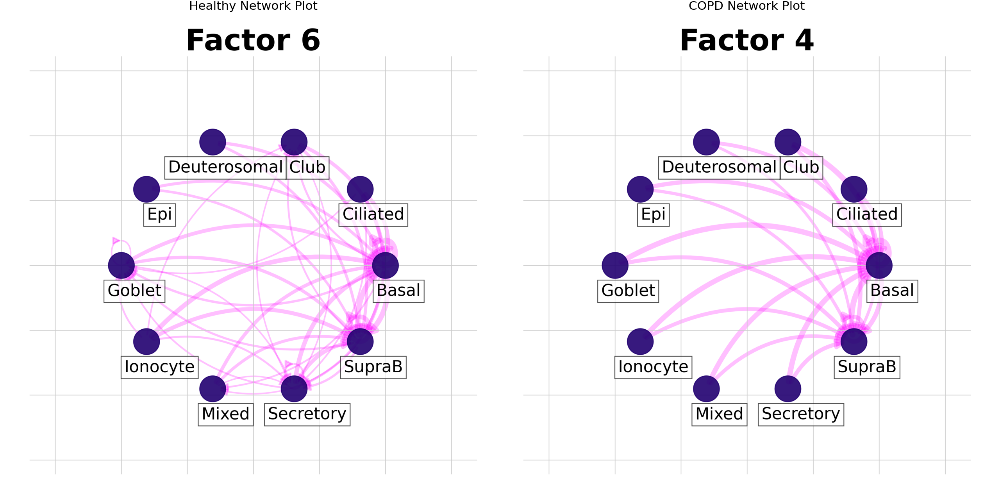

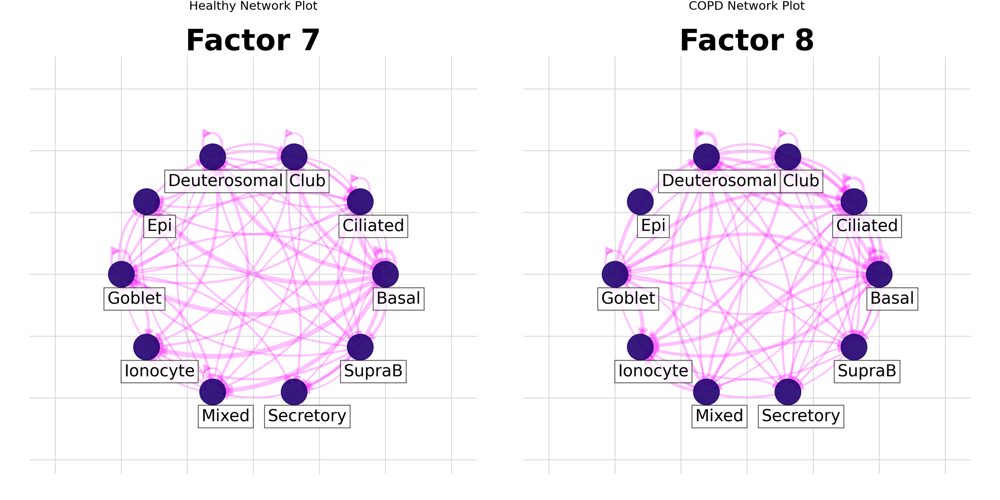

In [ ]:


for row in result.iterrows():
    healthy_factor_values = factors_healthy['Contexts'][row[1].name]
    COPD_factor_values = factors_COPD['Contexts'][row[1]['Row Index']]
    # Save the first plot to a buffer
    buf1 = save_plot_to_buffer(
        c2c.plotting.ccc_networks_plot,
        factors_healthy,
        included_factors=[row[1].name],
        network_layout='circular',
        ccc_threshold=0.07,
        nrows=3,
        panel_size=(8, 8)
    )

    # Save the second plot to a buffer
    buf2 = save_plot_to_buffer(
        c2c.plotting.ccc_networks_plot,
        factors_COPD,
        included_factors=[row[1]['Row Index']],
        network_layout='circular',
        ccc_threshold=0.07,
        nrows=3,
        panel_size=(8, 8)
    )

    # Load the images from the buffers
    img1 = PIL.Image.open(buf1)
    img2 = PIL.Image.open(buf2)

    # Create a new figure to display the images side by side
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Display each image in a subplot
    axs[0].imshow(img1)
    axs[0].set_title('Healthy Network Plot')
    axs[0].axis('off')  # Hide axes

    axs[1].imshow(img2)
    axs[1].set_title('COPD Network Plot')
    axs[1].axis('off')  # Hide axes

    # Adjust layout and display the combined figure
    plt.tight_layout()
    plt.show()

### Loadings

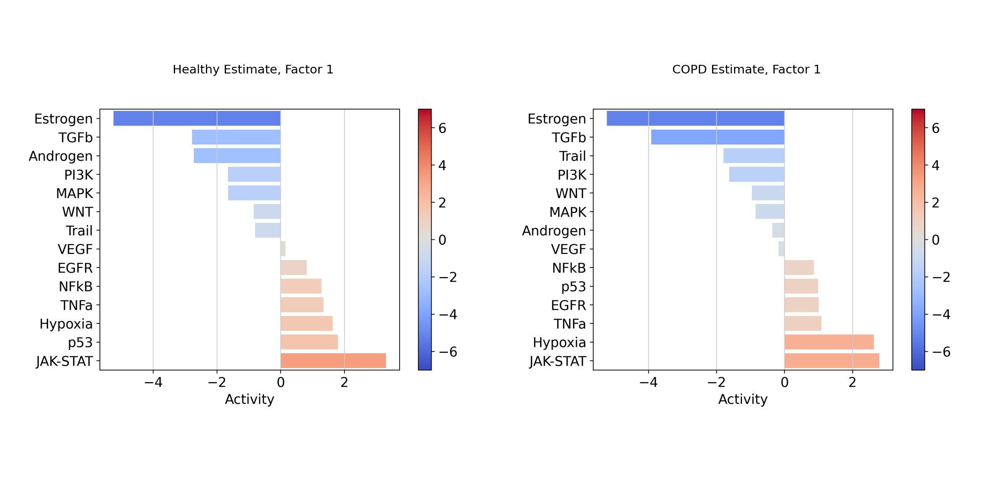

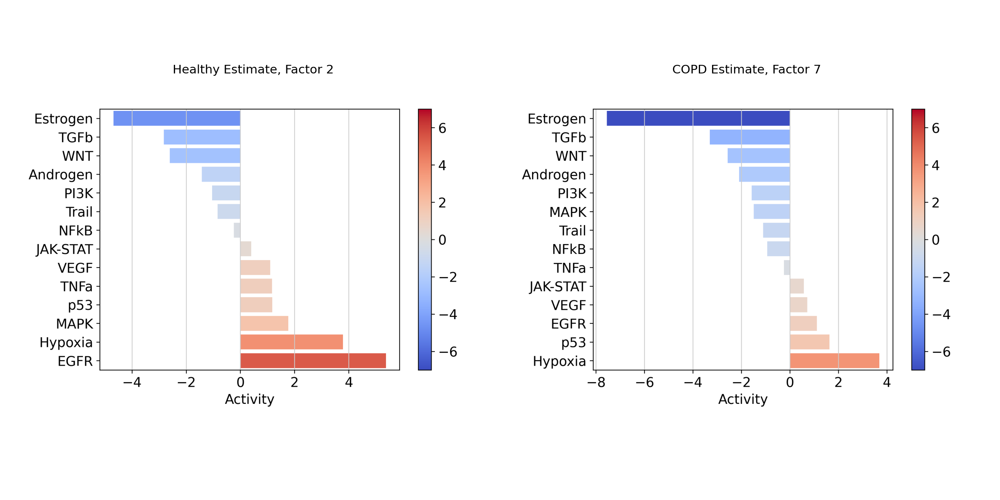

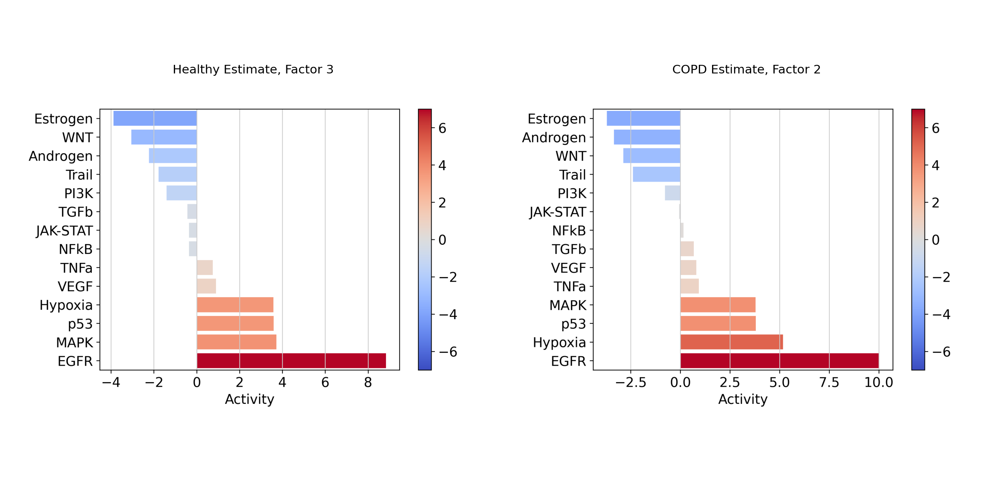

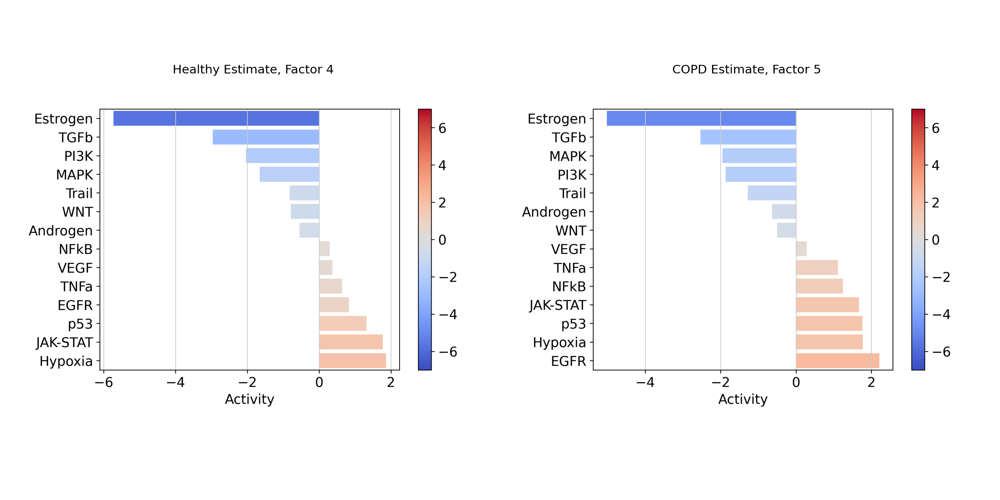

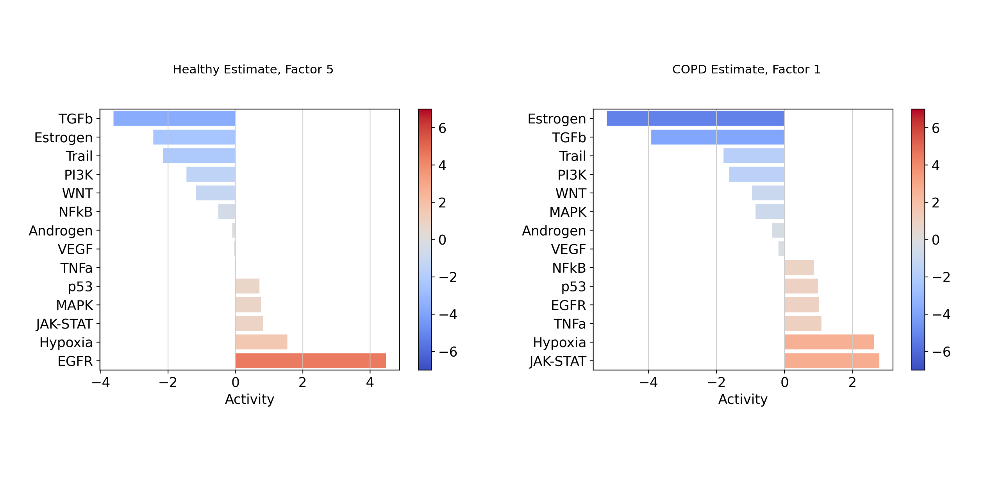

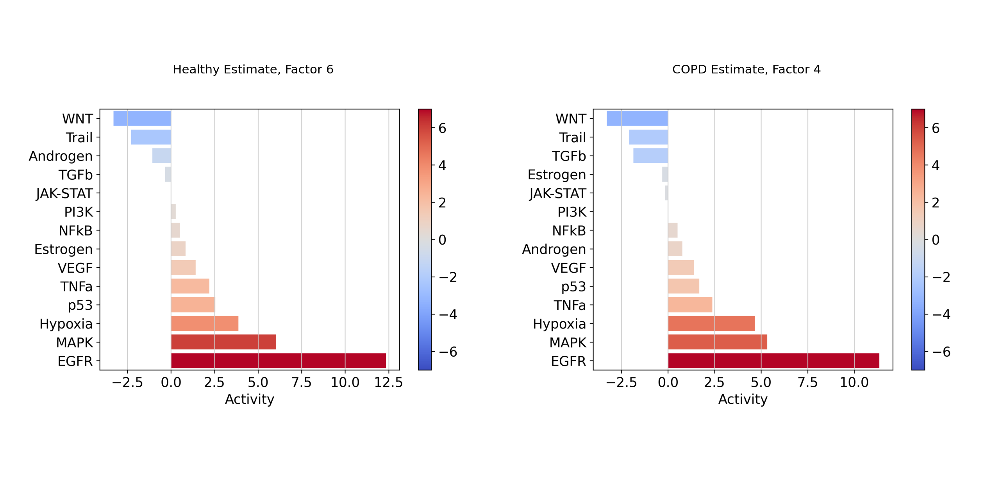

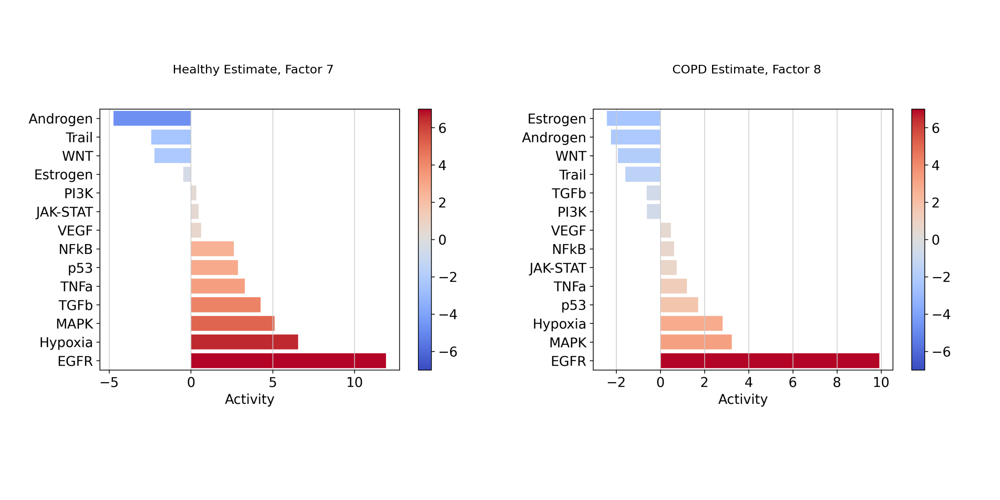

In [ ]:

# Function to save a plot to a BytesIO object
def save_plot_to_buffer(plot_func, *args, **kwargs):
    buf = BytesIO()
    plot_func(*args, **kwargs)
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close()
    return buf

for row in result.iterrows():
    # Save the first plot to a buffer
    buf1 = save_plot_to_buffer(
        dc.plot_barplot,
        estimate_healthy,
        row[1].name,
        vertical=True,
        cmap='coolwarm',
        vmin=-7,
        vmax=7
    )

    # Save the second plot to a buffer
    buf2 = save_plot_to_buffer(
        dc.plot_barplot,
        estimate_COPD,
        row[1]['Row Index'],
        vertical=True,
        cmap='coolwarm',
        vmin=-7,
        vmax=7
    )

    # Load the images from the buffers
    img1 = PIL.Image.open(buf1)
    img2 = PIL.Image.open(buf2)

    # Create a new figure to display the images side by side
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Display each image in a subplot
    axs[0].imshow(img1)
    axs[0].set_title(f'Healthy Estimate, {row[1].name}')
    axs[0].axis('off')  # Hide axes

    axs[1].imshow(img2)
    axs[1].set_title(f'COPD Estimate, {row[1]["Row Index"]}')
    axs[1].axis('off')  # Hide axes

    # Adjust layout and display the combined figure
    plt.tight_layout()
    plt.show()

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 15 rows containing missing values.
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_label : Removed 70 rows containing missing values.


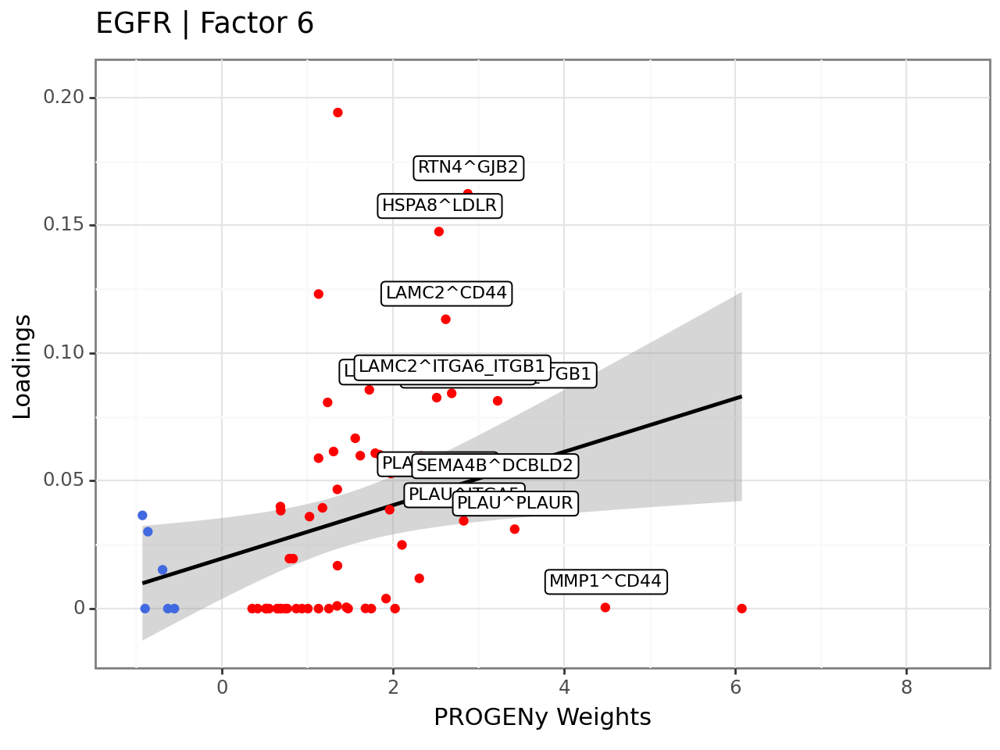

<Figure Size: (640 x 480)>

In [ ]:
#select factor of interest
selected_factor = 'Factor 6'
#select pathway of interest
pathway = 'EGFR'
# loadings to long format
lr_loadings_long = lr_loadings_healthy.reset_index().melt(id_vars='index', var_name="Factor", value_name="Loadings").rename(columns={'index':'interaction'})
# join progeny weights and keep only NFkB pathway
lr_loadings_long = lr_loadings_long.merge(lr_progeny, on='interaction').query("source == '{}' and Factor == '{}'".format(pathway, selected_factor))
# add sign to the weights
lr_loadings_long['sign'] = lr_loadings_long['weight'].apply(lambda x: 'positive' if x > 0 else 'negative')
# keep only relevant interactions for labels
lr_loadings_long['relevant_interactions'] = lr_loadings_long.apply(lambda x: x['interaction'] if (x['Loadings'] > 0.00025) and (x['weight'] > 2.5) else None, axis=1)

(p9.ggplot(lr_loadings_long,
           p9.aes(x='weight', y='Loadings')) +
 p9.geom_smooth(method='lm') +
 p9.geom_point(p9.aes(colour='sign')) +
 p9.theme_bw() +
 p9.theme(legend_position='none') +
 p9.labs(title="{} | {}".format(pathway, selected_factor), x="PROGENy Weights", y="Loadings") +
 p9.scale_colour_manual(values=["royalblue", "red"]) +
 p9.geom_label(p9.aes(label='relevant_interactions'), size=8, nudge_y=0.01, nudge_x=0.01) +
 p9.xlim(-1, 8.5)
 )